### Student Teacher Network Framework
### Steps:
####  1. Generate the Teacher (segmented frames)
####  2. Create the network
####  3. Train the network for reconstruction loss against the segmented frames



In [46]:
## Load the data

%load_ext autoreload
%autoreload 2

%pylab inline
import os
import cv2
import time
import numpy as np
import pandas as pd

import torch
import torchvision as tv
import torchvision.transforms as transforms
import torch.nn as nn
import torch.nn.functional as F
from torch.autograd import Variable
from torchvision.utils import save_image


os.getcwd()
home_dir = os.path.abspath('../../../')
data_dir = os.path.join(home_dir, 'data', 'ua_detrac',  'DETRAC-Images')
data_dir

home_dir

filter_path = os.path.join(home_dir, 'filters')
loader_path = os.path.join(home_dir, 'loaders')

sys.path.append(home_dir)
sys.path.append(loader_path)
sys.path.append(filter_path)

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload
Populating the interactive namespace from numpy and matplotlib


/nethome/jbang36/anaconda3/envs/eva_37/lib/python3.7/site-packages/IPython/core/magics/pylab.py:160: UserWarning: pylab import has clobbered these variables: ['load']
`%matplotlib` prevents importing * from pylab and numpy
  "\n`%matplotlib` prevents importing * from pylab and numpy"


In [47]:
# Load the data
from loaders.load import Load

start_time = time.time()
load = Load()

eva_dir = home_dir
image_dir = os.path.join(eva_dir, "data", "ua_detrac", "small-data")
anno_dir = os.path.join(eva_dir, "data", "ua_detrac", "small-annotations")

X, length_per_mvi = load.load_images(image_dir, grayscale = False)
Y_dict = load.load_XML(anno_dir, X, length_per_mvi)

print("Total time to load small data is", time.time() - start_time, "seconds")

  0%|          | 7/10421 [00:00<02:42, 63.98it/s]

image directory is  /home/jbang36/eva/data/ua_detrac/small-data
Length of file_names: 10421


100%|██████████| 10421/10421 [01:18<00:00, 133.03it/s]
1it [00:00,  2.69it/s]

MVI_20011.xml
mvi length: 664
car_labels length: 664


3it [00:00,  3.24it/s]

MVI_20012.xml
mvi length: 1600
car_labels length: 1600
MVI_20032.xml
mvi length: 2037
car_labels length: 2037


4it [00:01,  3.12it/s]

MVI_20033.xml
mvi length: 2821
car_labels length: 2821


5it [00:01,  2.84it/s]

MVI_20034.xml
mvi length: 3621
car_labels length: 3621


6it [00:02,  2.59it/s]

MVI_20035.xml
mvi length: 4421
car_labels length: 4421


7it [00:02,  2.60it/s]

MVI_20051.xml
mvi length: 5327
car_labels length: 5327


8it [00:02,  2.68it/s]

MVI_20052.xml
mvi length: 6021
car_labels length: 6021


10it [00:03,  2.97it/s]

MVI_20061.xml
mvi length: 6821
car_labels length: 6821
MVI_20062.xml
mvi length: 7621
car_labels length: 7621


11it [00:03,  3.07it/s]

MVI_20063.xml
mvi length: 8421
car_labels length: 8421


12it [00:04,  2.33it/s]

MVI_20064.xml
mvi length: 9221
car_labels length: 9221


13it [00:05,  1.96it/s]

MVI_20065.xml
mvi length: 10421
car_labels length: 10421
Total time to load small data is 83.68339848518372 seconds


In [48]:

def _split_train_test(X,Y_dict):
    n_samples, _, _, _= X.shape
    print(n_samples)
    train_index_end = int(len(X) * 0.8)
    print(train_index_end)

    X_train = X[:train_index_end]
    X_test = X[train_index_end:]

    Y_dict_train = {}
    Y_dict_test = {}
    for column in Y_dict:
        Y_dict_train[column] = Y_dict[column][:train_index_end]
        Y_dict_test[column] = Y_dict[column][train_index_end:]

    return X_train, X_test, Y_dict_train, Y_dict_test

X_train, X_test, Y_train_dict, Y_test_dict = _split_train_test(X, Y_dict)


10421
8336


In [49]:

X_train_norm = np.copy(X_train)
X_test_norm = np.copy(X_test)

def _format_image_fixed(X, height, width):
    n_samples,_,_,channels = X.shape
    X_new = np.ndarray(shape=(n_samples, height, width, channels))
    for i in range(n_samples):
        X_new[i] = cv2.resize(X[i],  (width,height))
    
    X_new /= 255.0
        
    return X_new


def _format_image(X, sampling_rate=12):
    print("before:", X.shape)
    reduction_rate = sampling_rate
    # need to down shape them so that the kernels can train faster
    # image should be num_samples, height, width, channel
    downsampled_images = X[:, ::reduction_rate, ::reduction_rate, :]
    downsampled_images = downsampled_images.astype(np.float32)
    print("After change, shape of image is", downsampled_images.shape)
    downsampled_images /= 255.0
    return downsampled_images

X_train_norm = _format_image_fixed(X_train_norm, 40, 80)
X_test_norm = _format_image_fixed(X_test_norm, 40, 80)



40 80 3


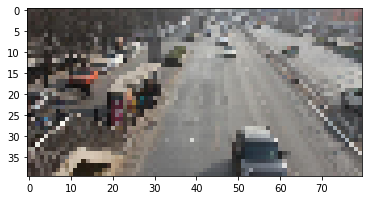

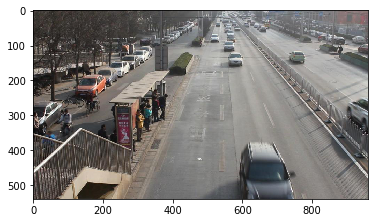

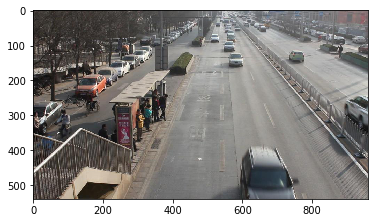

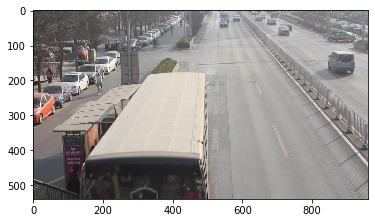

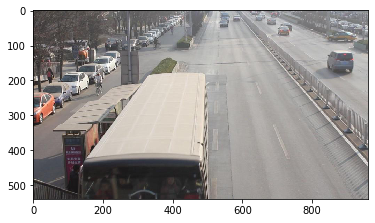

In [50]:

example = X_train_norm[0]
width, height, channels = example.shape
print(width, height, channels)
example = example * 255.0
example = example.astype(np.uint8)



plt.imshow(example)
plt.show()

for i in range(2):
    plt.imshow(X_train[i])
    plt.show()

for i in range(2):
    plt.imshow(X_test[i])
    plt.show()

In [51]:
# remove ipynb_checkpoints

image_dir
mvi_folders = os.listdir(image_dir)
mvi_folders.sort()
height = 40
width = 80
channels = 1

for i, mvi_folder_name in enumerate(mvi_folders):
    file_names = os.listdir(os.path.join(image_dir, mvi_folder_name))
    for file_name in file_names:
        if 'check' in file_name:
            print(mvi_folder_name)
            print("  " + file_name)
    

In [97]:
# Write Seg images by MVI folder

image_dir
mvi_folders = os.listdir(image_dir)
mvi_folders.sort()
height = 40
width = 80
channels = 1
curr_count = 0

for i, mvi_folder_name in enumerate(mvi_folders):
    print("folder name:", mvi_folder_name)
    fgbg = cv2.bgsegm.createBackgroundSubtractorMOG()
    #load the content of that folder
    file_names = os.listdir(os.path.join(image_dir, mvi_folder_name))
    arr = np.ndarray((len(file_names), height, width), dtype = np.uint8)
    print("  number of files:", len(file_names))
    file_names.sort()
    #fig = plt.figure(figsize=(40,80))
    if os.path.exists('mog_images/'+mvi_folder_name) == False: 
        os.makedirs('mog_images/'+mvi_folder_name)
    
    
    for j,file_name in enumerate(file_names):
        full_file_name = os.path.join(image_dir, mvi_folder_name, file_name)
        img = cv2.imread(full_file_name, 0)
        
        arr[i] = cv2.resize(img, (width, height))
        #print(arr[i].shape)
        fgmask = fgbg.apply(arr[i])
        #fig.add_subplot(1,2,1)
        #plt.imshow(arr[i], cmap = 'gray')
        #fig.add_subplot(1,2,2)
        #plt.imshow(fgmask, cmap = 'gray')
        #plt.show()
        write_name = os.path.join('mog_images', mvi_folder_name, 'image{:06d}.jpg'.format(curr_count))
        cv2.imwrite(write_name, fgmask)
        curr_count += 1
    
    
        
    print("    done!")
        
    
        
        
        

folder name: MVI_20011
  number of files: 664
    done!
folder name: MVI_20012
  number of files: 936
    done!
folder name: MVI_20032
  number of files: 437
    done!
folder name: MVI_20033
  number of files: 784
    done!
folder name: MVI_20034
  number of files: 800
    done!
folder name: MVI_20035
  number of files: 800
    done!
folder name: MVI_20051
  number of files: 906
    done!
folder name: MVI_20052
  number of files: 694
    done!
folder name: MVI_20061
  number of files: 800
    done!
folder name: MVI_20062
  number of files: 800
    done!
folder name: MVI_20063
  number of files: 800
    done!
folder name: MVI_20064
  number of files: 800
    done!
folder name: MVI_20065
  number of files: 1200
    done!


In [52]:
# 1. Try no derivatives
# 2. Try derivatives (subtract two contiguous images)

# Writing our model
class Autoencoder_seg(nn.Module):
    def __init__(self):
        super(Autoencoder_seg,self).__init__()
        
        self.K = 10
        self.output_channels = 1
        self.input_channels = 3
        self.seg_channels = 2
        self.middle_neural_count = 100
        
        self.create_enc()
        input_shape = (64, 10, 20) #input (3,40,80)
        self.create_central(input_shape)
        self.create_decoder_b()
        
    def forward(self,x):
        x1 = self.u_enc1(x)
        x2 = self.u_enc2(x1)
        x3 = self.u_enc3(x2)
        #print(x1.shape)
        n,c,h,w = x3.shape
        compressed = self.central_layers1(x3.view(n, c*h*w))
        extended = self.central_layers2(compressed)
        
        xb1 = self.u_decb1(torch.cat( (x3, extended.view(n, c, h, w)), dim = 1))
        xb2 = self.u_decb2(torch.cat( (x2, xb1), dim = 1))
        final_regen = self.u_decb3(torch.cat( (x1, xb2), dim = 1))
        
        
        #return [compressed, background_regen, foreground_regen, final_regen]
        return [compressed, final_regen]
    
    def create_enc(self):
        self.u_enc1 = nn.Sequential()
        self.u_enc1.add_module('Conv1_1', nn.Conv2d(self.input_channels, 16, kernel_size=3, padding = (1,1)))
        self.u_enc1.add_module('Relu1_2', nn.ReLU(True))
        self.u_enc1.add_module('Conv1_3', nn.Conv2d(16,16,kernel_size=3, padding = (1,1)))
        self.u_enc1.add_module('Relu1_4', nn.ReLU(True))
        
        self.u_enc2 = nn.Sequential()
        self.u_enc2.add_module('Max2_0', nn.MaxPool2d(2, stride = 2))
        self.u_enc2.add_module('Conv2_1', nn.Conv2d(16, 32, kernel_size=3, padding = (1,1)))
        self.u_enc2.add_module('Relu2_2', nn.ReLU(True))
        self.u_enc2.add_module('Conv2_3', nn.Conv2d(32, 32, kernel_size=3, padding = (1,1)))
        self.u_enc2.add_module('Relu2_4', nn.ReLU(True))
        
        
        self.u_enc3 = nn.Sequential()
        self.u_enc3.add_module('Max3_0', nn.MaxPool2d(2, stride = 2))
        self.u_enc3.add_module('Conv3_1', nn.Conv2d(32, 64, kernel_size=3, padding = (1,1)))
        self.u_enc3.add_module('Relu3_2', nn.ReLU(True))
        self.u_enc3.add_module('Conv3_3', nn.Conv2d(64, 64, kernel_size=3, padding = (1,1)))
        self.u_enc3.add_module('Relu3_4', nn.ReLU(True))
        
        
    def create_central(self, input_shape):
        c,h,w = input_shape
        self.central_layers1 = nn.Sequential()
        self.central_layers1.add_module('Mlp', nn.Linear(c*h*w, self.middle_neural_count))
        
        self.central_layers2 = nn.Sequential()
        self.central_layers2.add_module('Mlp', nn.Linear(self.middle_neural_count, c*h*w))
        
    def create_decoder_b(self):
        self.u_decb1 = nn.Sequential()
        #self.u_decb1.add_module('CT4_1', nn.ConvTranspose2d(64, 64, kernel_size = 2, stride = 2))
        self.u_decb1.add_module('Conv4_2', nn.Conv2d(128, 64, kernel_size=3, padding = (1,1)))
        self.u_decb1.add_module('Relu4_3', nn.ReLU(True))
        self.u_decb1.add_module('Conv4_4', nn.Conv2d(64, 32, kernel_size=3, padding = (1,1)))
        self.u_decb1.add_module('Relu4_5', nn.ReLU(True))
        self.u_decb1.add_module('CT4_6', nn.ConvTranspose2d(32, 32, kernel_size = 2, stride = 2))
        
        
        self.u_decb2 = nn.Sequential()
        self.u_decb2.add_module('Conv5_2', nn.Conv2d(64, 32, kernel_size=3, padding = (1,1)))
        self.u_decb2.add_module('Relu5_3', nn.ReLU(True))
        self.u_decb2.add_module('Conv5_4', nn.Conv2d(32, 16, kernel_size=3, padding = (1,1)))
        self.u_decb2.add_module('Relu5_5', nn.ReLU(True))
        self.u_decb2.add_module('CT5_6', nn.ConvTranspose2d(16, 16, kernel_size = 2, stride = 2))
        
        
        self.u_decb3 = nn.Sequential()
        self.u_decb3.add_module('Conv6_2', nn.Conv2d(32, 8, kernel_size=3, padding = (1,1)))
        self.u_decb3.add_module('Relu6_3', nn.ReLU(True))
        self.u_decb3.add_module('Conv6_4', nn.Conv2d(8, self.output_channels, kernel_size=3, padding = (1,1)))
        self.u_decb3.add_module('Relu6_5', nn.ReLU(True))
        
    

In [53]:
def custom_distance_loss(y_hat, target, loss_amp_factor):
    return loss_amp_factor * ((y_hat - target)**2).mean()

In [54]:
os.getcwd()

'/home/jbang36/eva/others/jupyter/wnet'

In [55]:
# TODO: Need to load the segmented image... and use this as comparison....
# Fix this box below...

seg_dir = os.path.join(os.getcwd(), 'mog_images')
mvi_folders = os.listdir(seg_dir)
mvi_folders.sort()

height = 40
width = 80
channels = 1
curr_count = 0

seg_X = np.ndarray((X.shape[0],height, width))

for i, mvi_folder_name in enumerate(mvi_folders):
    if '.ipynb_checkpoints' in mvi_folder_name:
        continue
    print("folder name:", mvi_folder_name)
    #load the content of that folder
    file_names = os.listdir(os.path.join(seg_dir, mvi_folder_name))
    print("  number of files:", len(file_names))
    file_names.sort()
    
    for j,file_name in enumerate(file_names):
        full_file_name = os.path.join(seg_dir, mvi_folder_name, file_name)
        seg_X[curr_count] = cv2.imread(full_file_name, 0)    
        curr_count += 1
    

print(curr_count)
print(X.shape)
print(seg_X.shape)
assert(curr_count == seg_X.shape[0])

seg_test = seg_X[int(len(seg_X) * 0.8):]
seg_train = seg_X[:int(len(seg_X) * 0.8)]
    

folder name: MVI_20011
  number of files: 664
folder name: MVI_20012
  number of files: 936
folder name: MVI_20032
  number of files: 437
folder name: MVI_20033
  number of files: 784
folder name: MVI_20034
  number of files: 800
folder name: MVI_20035
  number of files: 800
folder name: MVI_20051
  number of files: 906
folder name: MVI_20052
  number of files: 694
folder name: MVI_20061
  number of files: 800
folder name: MVI_20062
  number of files: 800
folder name: MVI_20063
  number of files: 800
folder name: MVI_20064
  number of files: 800
folder name: MVI_20065
  number of files: 1200
10421
(10421, 540, 960, 3)
(10421, 40, 80)


In [22]:
np.set_printoptions(threshold=sys.maxsize)
seg_train[1]

array([[  0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,
          0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,
          0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,
          0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,
          0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,
          0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,
          0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,
          0.,   0.,   0.],
       [  0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,
          0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,
          0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,
          0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,
          0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,
          0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,
          0

In [14]:
seg_test.shape

(2085, 40, 80)

In [56]:
# before creating the dataloader, we need to augment the data
seg_train_norm = seg_train / 255.0
seg_test_norm = seg_test / 255.0


In [ ]:
import gc
gc.collect()


torch.cuda.empty_cache() 
os.environ["CUDA_VISIBLE_DEVICES"]="0"
torch.cuda.device(0)

In [58]:
X_train.shape

(8336, 540, 960, 3)

KeyboardInterrupt: 

In [59]:
model = Autoencoder_seg().cuda()
distance = nn.MSELoss()

# Loss Function Revision

batch_size = 64
n_samples, H, W, C = X_train_norm.shape



train_data = torch.from_numpy(X_train_norm).float()
train_data = train_data.permute(0,3,1,2)



seg_data = torch.from_numpy(seg_train_norm).float() #TODO: is this really seg_train??? or is it seg_train_norm??
seg_data = seg_data.unsqueeze_(-1)
print(seg_data.size())
seg_data = seg_data.permute(0,3,1,2)
print(seg_data.size())

train_loader = torch.utils.data.DataLoader(torch.cat((train_data,seg_data), dim = 1), shuffle=False, batch_size=batch_size, num_workers=4, drop_last=True)

#dist_diff_matrix = calculate_dist_matrix(batch_size, H,W)

NameError: name 'hsv_data_norm' is not defined

In [40]:
def convert(recon):
    recon_p = recon.permute(0,2,3,1)
    #print(recon_p.size())
    recon_imgs = recon_p.detach().cpu().numpy()
    recon_imgs *= 255
    recon_imgs = recon_imgs.astype(np.uint8)
    return recon_imgs

def convert_one(recon):
    recon_p = recon.permute(0,2,3,1)
    #print(recon_p.size())
    recon_imgs = recon_p.detach().cpu().numpy()
    recon_imgs *= 255
    recon_imgs = recon_imgs.astype(np.uint8)
    recon_imgs = recon_imgs.squeeze()
    return recon_imgs

def convert_soft(seged):
    K = 2


    N,K,H,W = seged.size()
    arged = torch.argmax(seged, dim = 1) #channels is 1
    arged = arged * 255 / (K - 1)
    arged_imgs = arged.detach().cpu().numpy()


    arged_imgs = arged_imgs.astype(np.uint8)
    assert(arged_imgs.shape == (N,H,W))
    return arged_imgs

In [35]:
a = np.ndarray((2,3,1))
print(a.shape)
a = a.squeeze()
print(a.shape)

(2, 3, 1)
(2, 3)


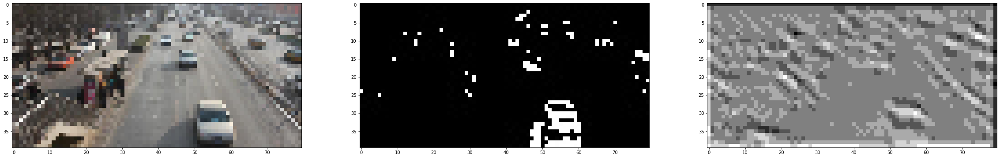

epoch [1/2000], loss_total:0.0463, time elapsed:7.4212 (sec)
epoch [2/2000], loss_total:0.0463, time elapsed:4.3542 (sec)
epoch [3/2000], loss_total:0.0463, time elapsed:4.4958 (sec)
epoch [4/2000], loss_total:0.0461, time elapsed:4.5361 (sec)
epoch [5/2000], loss_total:0.0458, time elapsed:4.5453 (sec)


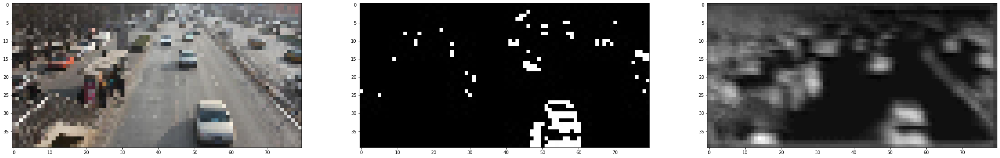

epoch [6/2000], loss_total:0.0454, time elapsed:7.1641 (sec)
epoch [7/2000], loss_total:0.0451, time elapsed:4.3384 (sec)
epoch [8/2000], loss_total:0.0447, time elapsed:4.2365 (sec)
epoch [9/2000], loss_total:0.0445, time elapsed:4.5457 (sec)
epoch [10/2000], loss_total:0.0442, time elapsed:4.3550 (sec)


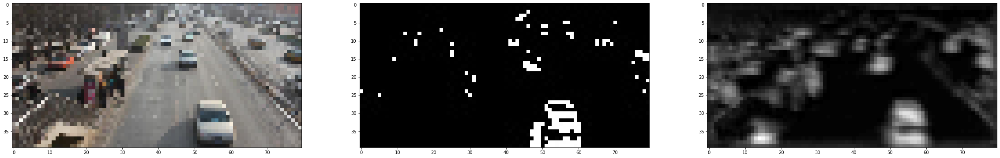

epoch [11/2000], loss_total:0.0442, time elapsed:6.9497 (sec)
epoch [12/2000], loss_total:0.0439, time elapsed:4.8965 (sec)
epoch [13/2000], loss_total:0.0440, time elapsed:4.3545 (sec)
epoch [14/2000], loss_total:0.0437, time elapsed:4.7544 (sec)
epoch [15/2000], loss_total:0.0441, time elapsed:5.1161 (sec)


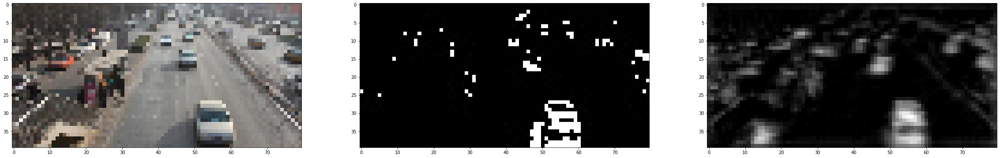

epoch [16/2000], loss_total:0.0440, time elapsed:7.4884 (sec)
epoch [17/2000], loss_total:0.0437, time elapsed:4.6406 (sec)
epoch [18/2000], loss_total:0.0434, time elapsed:4.3810 (sec)
epoch [19/2000], loss_total:0.0431, time elapsed:4.3231 (sec)
epoch [20/2000], loss_total:0.0430, time elapsed:4.6981 (sec)


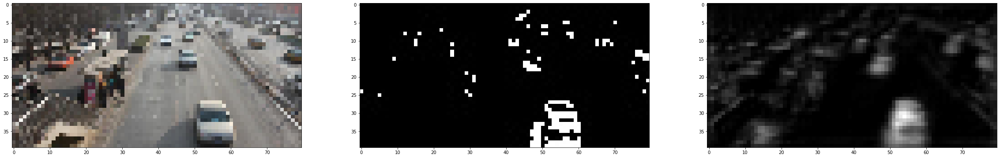

epoch [21/2000], loss_total:0.0429, time elapsed:6.9010 (sec)
epoch [22/2000], loss_total:0.0428, time elapsed:4.3338 (sec)
epoch [23/2000], loss_total:0.0429, time elapsed:4.1494 (sec)
epoch [24/2000], loss_total:0.0429, time elapsed:4.2418 (sec)
epoch [25/2000], loss_total:0.0429, time elapsed:4.3002 (sec)


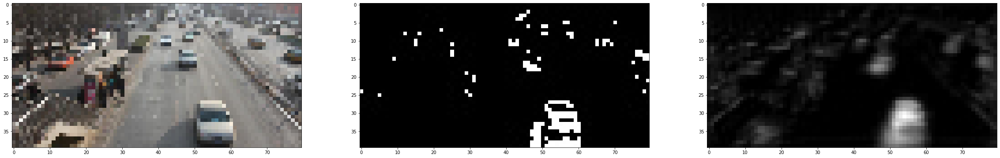

epoch [26/2000], loss_total:0.0429, time elapsed:6.9280 (sec)
epoch [27/2000], loss_total:0.0429, time elapsed:4.3055 (sec)
epoch [28/2000], loss_total:0.0430, time elapsed:4.4097 (sec)
epoch [29/2000], loss_total:0.0430, time elapsed:4.5873 (sec)
epoch [30/2000], loss_total:0.0430, time elapsed:4.1255 (sec)


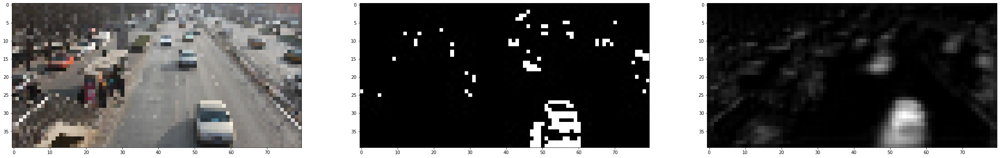

epoch [31/2000], loss_total:0.0430, time elapsed:7.1007 (sec)
epoch [32/2000], loss_total:0.0429, time elapsed:4.3348 (sec)
epoch [33/2000], loss_total:0.0429, time elapsed:4.4597 (sec)
epoch [34/2000], loss_total:0.0429, time elapsed:4.1103 (sec)
epoch [35/2000], loss_total:0.0429, time elapsed:4.2329 (sec)


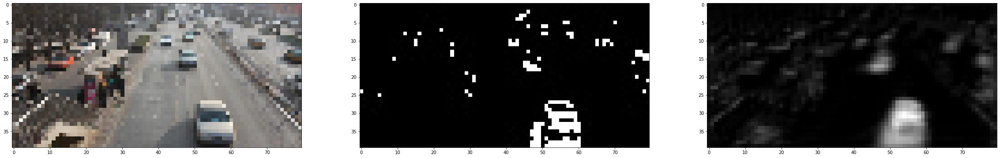

epoch [36/2000], loss_total:0.0429, time elapsed:6.6564 (sec)
epoch [37/2000], loss_total:0.0429, time elapsed:4.5386 (sec)
epoch [38/2000], loss_total:0.0429, time elapsed:4.4272 (sec)
epoch [39/2000], loss_total:0.0429, time elapsed:4.3692 (sec)
epoch [40/2000], loss_total:0.0429, time elapsed:4.3993 (sec)


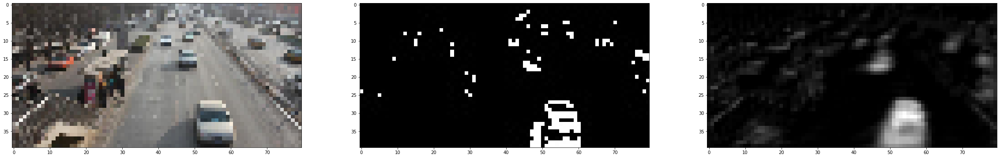

epoch [41/2000], loss_total:0.0428, time elapsed:6.9998 (sec)
epoch [42/2000], loss_total:0.0428, time elapsed:4.2310 (sec)
epoch [43/2000], loss_total:0.0428, time elapsed:4.3186 (sec)
epoch [44/2000], loss_total:0.0428, time elapsed:4.7214 (sec)
epoch [45/2000], loss_total:0.0428, time elapsed:4.5248 (sec)


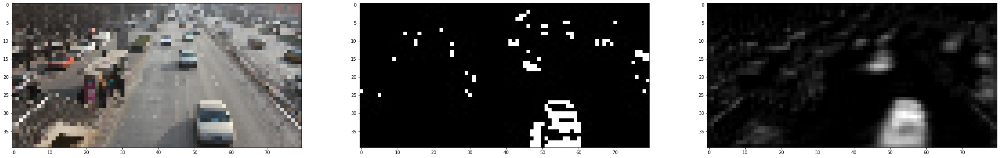

epoch [46/2000], loss_total:0.0428, time elapsed:6.8972 (sec)
epoch [47/2000], loss_total:0.0428, time elapsed:4.5183 (sec)
epoch [48/2000], loss_total:0.0428, time elapsed:4.4813 (sec)
epoch [49/2000], loss_total:0.0429, time elapsed:4.3115 (sec)
epoch [50/2000], loss_total:0.0429, time elapsed:4.3236 (sec)


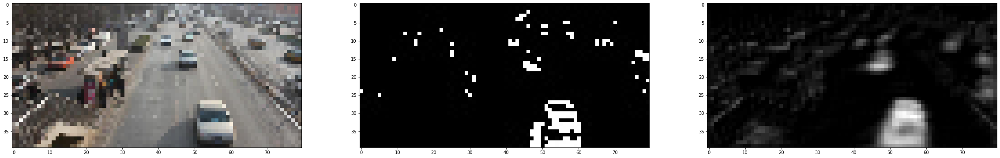

epoch [51/2000], loss_total:0.0429, time elapsed:6.9711 (sec)
epoch [52/2000], loss_total:0.0429, time elapsed:4.6139 (sec)
epoch [53/2000], loss_total:0.0429, time elapsed:4.2540 (sec)
epoch [54/2000], loss_total:0.0429, time elapsed:4.3960 (sec)
epoch [55/2000], loss_total:0.0429, time elapsed:4.0961 (sec)


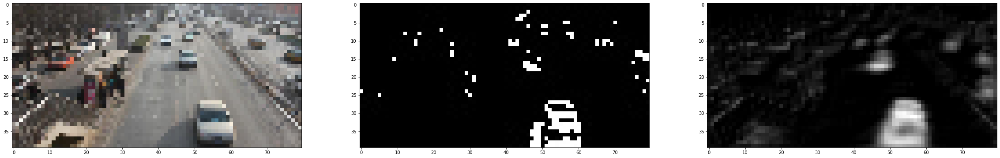

epoch [56/2000], loss_total:0.0430, time elapsed:7.4568 (sec)
epoch [57/2000], loss_total:0.0430, time elapsed:4.6152 (sec)
epoch [58/2000], loss_total:0.0430, time elapsed:4.9794 (sec)
epoch [59/2000], loss_total:0.0430, time elapsed:4.8168 (sec)
epoch [60/2000], loss_total:0.0430, time elapsed:4.7135 (sec)


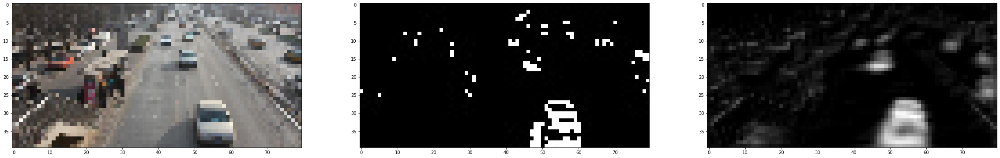

epoch [61/2000], loss_total:0.0430, time elapsed:6.8440 (sec)
epoch [62/2000], loss_total:0.0430, time elapsed:4.3785 (sec)
epoch [63/2000], loss_total:0.0431, time elapsed:4.2581 (sec)
epoch [64/2000], loss_total:0.0431, time elapsed:4.4972 (sec)
epoch [65/2000], loss_total:0.0431, time elapsed:4.3180 (sec)


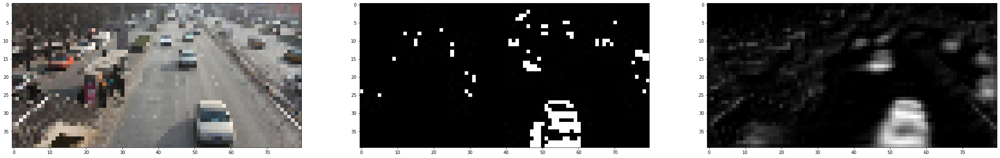

epoch [66/2000], loss_total:0.0431, time elapsed:6.9842 (sec)
epoch [67/2000], loss_total:0.0431, time elapsed:4.3057 (sec)
epoch [68/2000], loss_total:0.0431, time elapsed:4.1946 (sec)
epoch [69/2000], loss_total:0.0431, time elapsed:4.6870 (sec)
epoch [70/2000], loss_total:0.0431, time elapsed:4.3587 (sec)


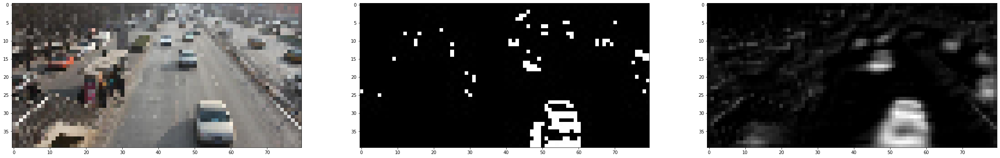

epoch [71/2000], loss_total:0.0431, time elapsed:7.1050 (sec)
epoch [72/2000], loss_total:0.0431, time elapsed:4.7999 (sec)
epoch [73/2000], loss_total:0.0430, time elapsed:5.0702 (sec)
epoch [74/2000], loss_total:0.0430, time elapsed:4.7498 (sec)
epoch [75/2000], loss_total:0.0430, time elapsed:4.6340 (sec)


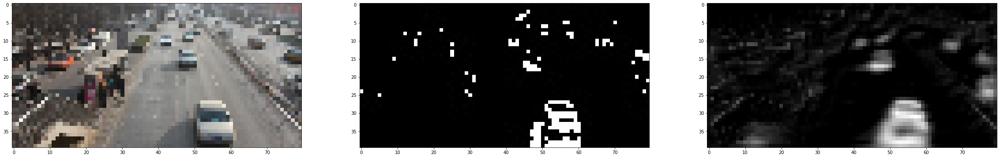

epoch [76/2000], loss_total:0.0430, time elapsed:7.4586 (sec)
epoch [77/2000], loss_total:0.0430, time elapsed:4.4052 (sec)
epoch [78/2000], loss_total:0.0430, time elapsed:4.8378 (sec)
epoch [79/2000], loss_total:0.0429, time elapsed:4.5156 (sec)
epoch [80/2000], loss_total:0.0429, time elapsed:4.6736 (sec)


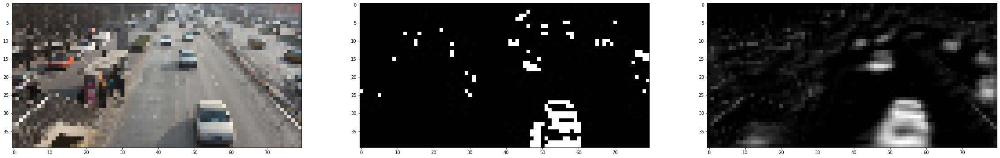

epoch [81/2000], loss_total:0.0429, time elapsed:7.2859 (sec)
epoch [82/2000], loss_total:0.0429, time elapsed:4.5847 (sec)
epoch [83/2000], loss_total:0.0428, time elapsed:4.8660 (sec)
epoch [84/2000], loss_total:0.0428, time elapsed:4.7130 (sec)
epoch [85/2000], loss_total:0.0428, time elapsed:5.0445 (sec)


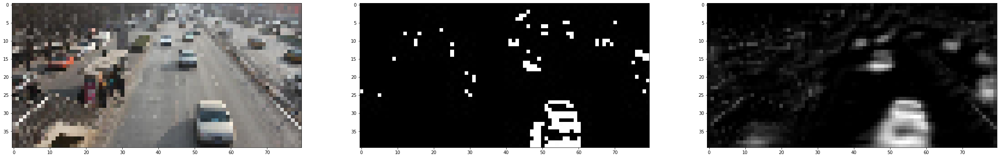

epoch [86/2000], loss_total:0.0427, time elapsed:7.4311 (sec)
epoch [87/2000], loss_total:0.0427, time elapsed:4.6650 (sec)
epoch [88/2000], loss_total:0.0426, time elapsed:4.3495 (sec)
epoch [89/2000], loss_total:0.0426, time elapsed:4.5471 (sec)
epoch [90/2000], loss_total:0.0425, time elapsed:4.3199 (sec)


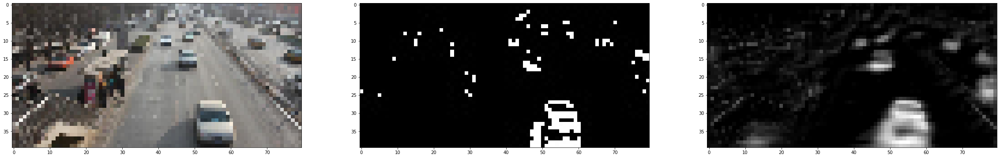

epoch [91/2000], loss_total:0.0425, time elapsed:7.6315 (sec)
epoch [92/2000], loss_total:0.0424, time elapsed:4.4048 (sec)
epoch [93/2000], loss_total:0.0423, time elapsed:4.2396 (sec)
epoch [94/2000], loss_total:0.0423, time elapsed:4.3470 (sec)
epoch [95/2000], loss_total:0.0422, time elapsed:4.2094 (sec)


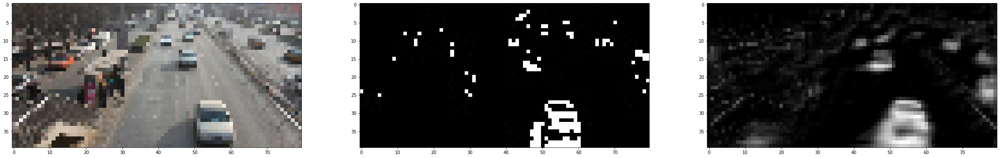

epoch [96/2000], loss_total:0.0421, time elapsed:6.8224 (sec)
epoch [97/2000], loss_total:0.0420, time elapsed:4.4298 (sec)
epoch [98/2000], loss_total:0.0420, time elapsed:4.1624 (sec)
epoch [99/2000], loss_total:0.0418, time elapsed:4.4241 (sec)
epoch [100/2000], loss_total:0.0418, time elapsed:4.2266 (sec)


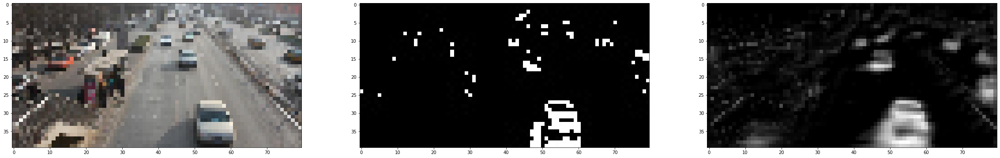

epoch [101/2000], loss_total:0.0417, time elapsed:6.8292 (sec)
epoch [102/2000], loss_total:0.0416, time elapsed:4.3367 (sec)
epoch [103/2000], loss_total:0.0416, time elapsed:4.9050 (sec)
epoch [104/2000], loss_total:0.0415, time elapsed:4.1808 (sec)
epoch [105/2000], loss_total:0.0414, time elapsed:4.9942 (sec)


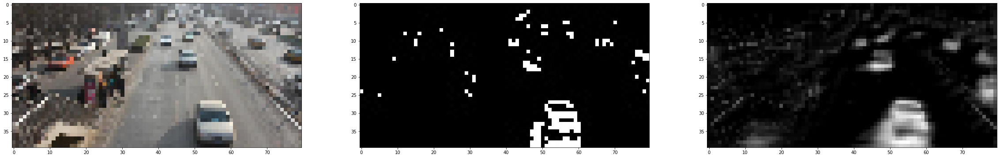

epoch [106/2000], loss_total:0.0414, time elapsed:6.8765 (sec)
epoch [107/2000], loss_total:0.0413, time elapsed:4.2872 (sec)
epoch [108/2000], loss_total:0.0412, time elapsed:4.3152 (sec)
epoch [109/2000], loss_total:0.0412, time elapsed:4.4730 (sec)
epoch [110/2000], loss_total:0.0411, time elapsed:4.2364 (sec)


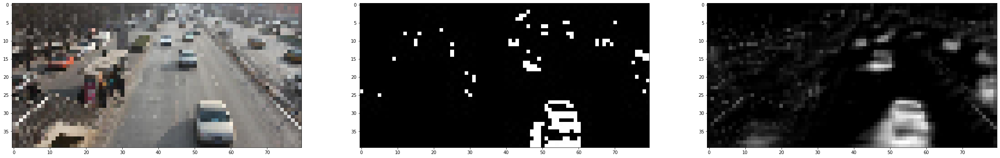

epoch [111/2000], loss_total:0.0410, time elapsed:6.8423 (sec)
epoch [112/2000], loss_total:0.0410, time elapsed:4.3190 (sec)
epoch [113/2000], loss_total:0.0409, time elapsed:4.6498 (sec)
epoch [114/2000], loss_total:0.0409, time elapsed:4.5664 (sec)
epoch [115/2000], loss_total:0.0408, time elapsed:4.5454 (sec)


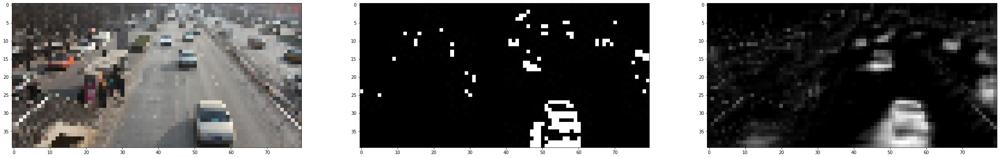

epoch [116/2000], loss_total:0.0408, time elapsed:7.8121 (sec)
epoch [117/2000], loss_total:0.0407, time elapsed:4.4238 (sec)
epoch [118/2000], loss_total:0.0407, time elapsed:4.8063 (sec)
epoch [119/2000], loss_total:0.0406, time elapsed:4.5306 (sec)
epoch [120/2000], loss_total:0.0406, time elapsed:4.3349 (sec)


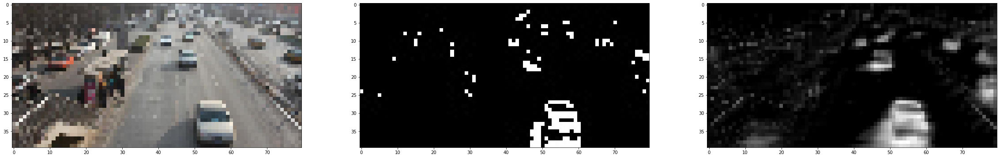

epoch [121/2000], loss_total:0.0406, time elapsed:7.0073 (sec)
epoch [122/2000], loss_total:0.0407, time elapsed:4.2372 (sec)
epoch [123/2000], loss_total:0.0405, time elapsed:4.1882 (sec)
epoch [124/2000], loss_total:0.0404, time elapsed:4.2802 (sec)
epoch [125/2000], loss_total:0.0404, time elapsed:4.1958 (sec)


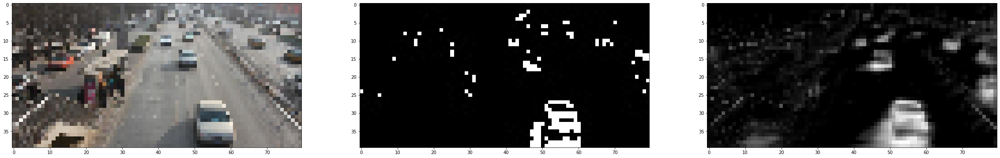

epoch [126/2000], loss_total:0.0403, time elapsed:7.3410 (sec)
epoch [127/2000], loss_total:0.0402, time elapsed:4.4469 (sec)
epoch [128/2000], loss_total:0.0403, time elapsed:4.2652 (sec)
epoch [129/2000], loss_total:0.0400, time elapsed:4.2118 (sec)
epoch [130/2000], loss_total:0.0400, time elapsed:4.5911 (sec)


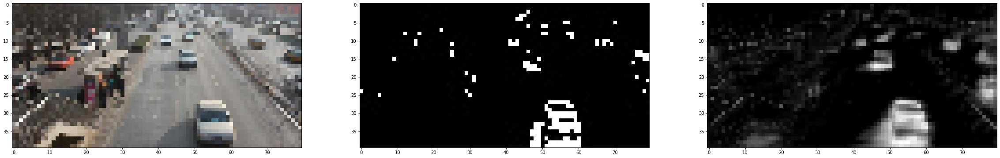

epoch [131/2000], loss_total:0.0400, time elapsed:6.9236 (sec)
epoch [132/2000], loss_total:0.0398, time elapsed:4.4998 (sec)
epoch [133/2000], loss_total:0.0397, time elapsed:4.2723 (sec)
epoch [134/2000], loss_total:0.0396, time elapsed:4.3438 (sec)
epoch [135/2000], loss_total:0.0395, time elapsed:4.3863 (sec)


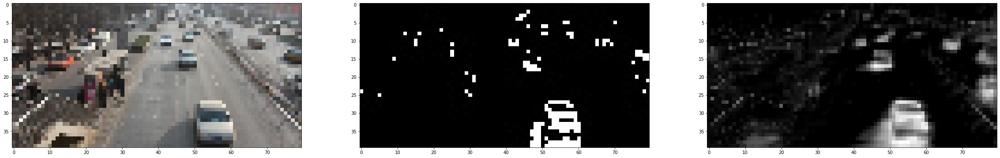

epoch [136/2000], loss_total:0.0395, time elapsed:7.2426 (sec)
epoch [137/2000], loss_total:0.0394, time elapsed:4.7505 (sec)
epoch [138/2000], loss_total:0.0393, time elapsed:5.0329 (sec)
epoch [139/2000], loss_total:0.0394, time elapsed:4.6578 (sec)
epoch [140/2000], loss_total:0.0391, time elapsed:4.2935 (sec)


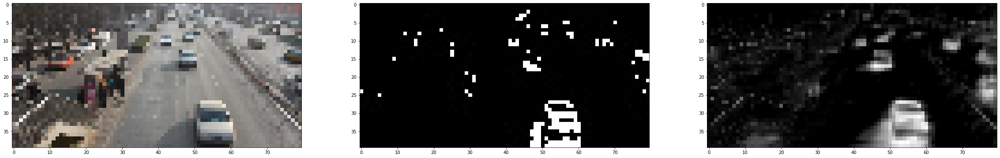

epoch [141/2000], loss_total:0.0391, time elapsed:7.0228 (sec)
epoch [142/2000], loss_total:0.0391, time elapsed:4.7407 (sec)
epoch [143/2000], loss_total:0.0390, time elapsed:4.1475 (sec)
epoch [144/2000], loss_total:0.0390, time elapsed:4.4994 (sec)
epoch [145/2000], loss_total:0.0389, time elapsed:4.2844 (sec)


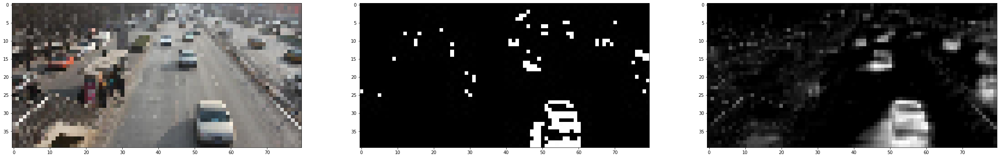

epoch [146/2000], loss_total:0.0389, time elapsed:7.0786 (sec)
epoch [147/2000], loss_total:0.0388, time elapsed:4.3261 (sec)
epoch [148/2000], loss_total:0.0388, time elapsed:4.1577 (sec)
epoch [149/2000], loss_total:0.0388, time elapsed:4.6585 (sec)
epoch [150/2000], loss_total:0.0387, time elapsed:4.5414 (sec)


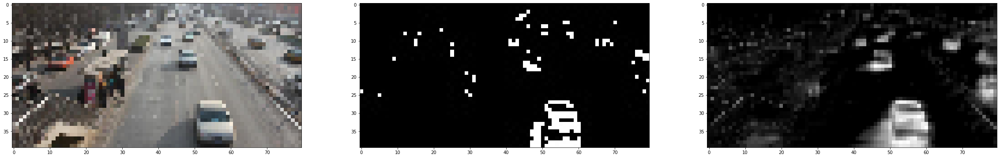

epoch [151/2000], loss_total:0.0387, time elapsed:7.2798 (sec)
epoch [152/2000], loss_total:0.0389, time elapsed:4.2223 (sec)
epoch [153/2000], loss_total:0.0388, time elapsed:4.4850 (sec)
epoch [154/2000], loss_total:0.0388, time elapsed:4.2268 (sec)
epoch [155/2000], loss_total:0.0389, time elapsed:4.6202 (sec)


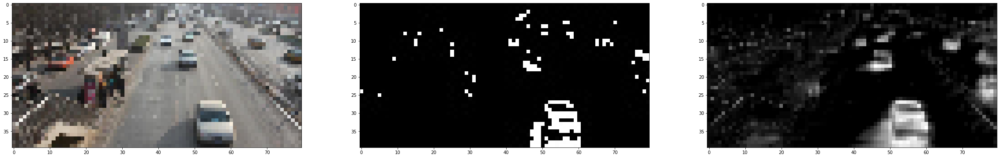

epoch [156/2000], loss_total:0.0389, time elapsed:7.3938 (sec)
epoch [157/2000], loss_total:0.0385, time elapsed:4.6046 (sec)
epoch [158/2000], loss_total:0.0389, time elapsed:4.3932 (sec)
epoch [159/2000], loss_total:0.0390, time elapsed:4.4363 (sec)
epoch [160/2000], loss_total:0.0391, time elapsed:4.6080 (sec)


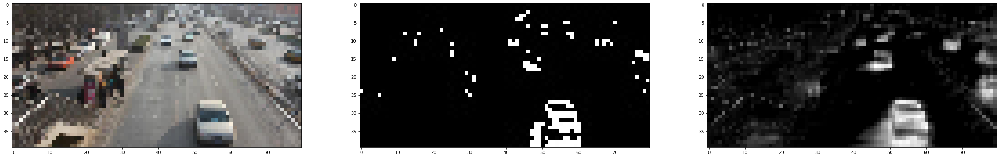

epoch [161/2000], loss_total:0.0391, time elapsed:7.0500 (sec)
epoch [162/2000], loss_total:0.0391, time elapsed:4.8133 (sec)
epoch [163/2000], loss_total:0.0391, time elapsed:4.3815 (sec)
epoch [164/2000], loss_total:0.0391, time elapsed:4.3063 (sec)
epoch [165/2000], loss_total:0.0394, time elapsed:5.3484 (sec)


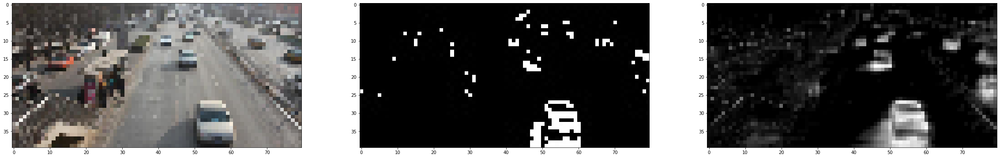

epoch [166/2000], loss_total:0.0391, time elapsed:6.9521 (sec)
epoch [167/2000], loss_total:0.0391, time elapsed:4.4118 (sec)
epoch [168/2000], loss_total:0.0391, time elapsed:4.7388 (sec)
epoch [169/2000], loss_total:0.0391, time elapsed:4.2355 (sec)
epoch [170/2000], loss_total:0.0390, time elapsed:4.6123 (sec)


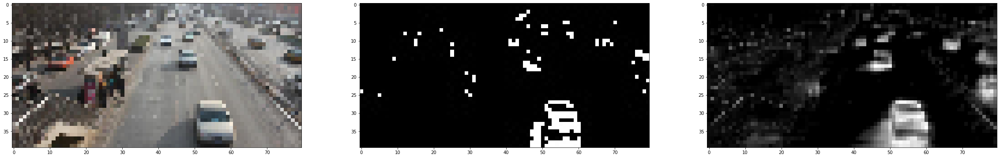

epoch [171/2000], loss_total:0.0390, time elapsed:6.8287 (sec)
epoch [172/2000], loss_total:0.0390, time elapsed:4.8729 (sec)
epoch [173/2000], loss_total:0.0390, time elapsed:4.4712 (sec)
epoch [174/2000], loss_total:0.0389, time elapsed:5.2423 (sec)
epoch [175/2000], loss_total:0.0389, time elapsed:4.4625 (sec)


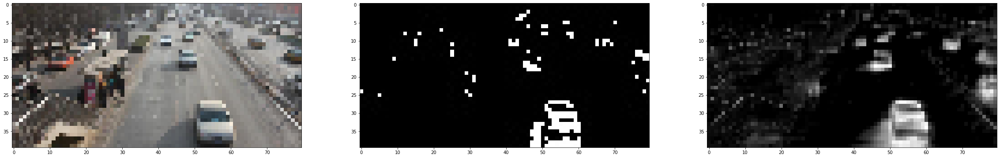

epoch [176/2000], loss_total:0.0389, time elapsed:6.7343 (sec)
epoch [177/2000], loss_total:0.0388, time elapsed:4.2690 (sec)
epoch [178/2000], loss_total:0.0388, time elapsed:4.3470 (sec)
epoch [179/2000], loss_total:0.0387, time elapsed:4.3917 (sec)
epoch [180/2000], loss_total:0.0387, time elapsed:4.2559 (sec)


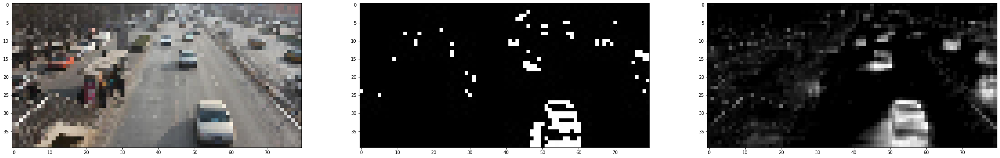

epoch [181/2000], loss_total:0.0386, time elapsed:7.1054 (sec)
epoch [182/2000], loss_total:0.0386, time elapsed:4.5593 (sec)
epoch [183/2000], loss_total:0.0386, time elapsed:4.7036 (sec)
epoch [184/2000], loss_total:0.0385, time elapsed:4.9381 (sec)
epoch [185/2000], loss_total:0.0385, time elapsed:4.3838 (sec)


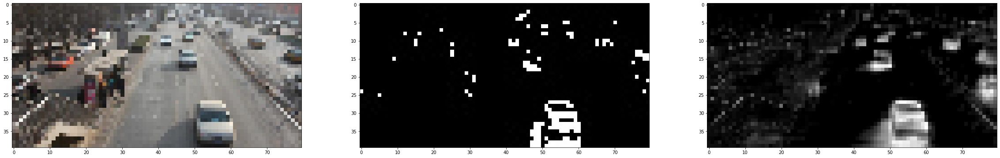

epoch [186/2000], loss_total:0.0384, time elapsed:7.1966 (sec)
epoch [187/2000], loss_total:0.0384, time elapsed:4.6376 (sec)
epoch [188/2000], loss_total:0.0383, time elapsed:4.5014 (sec)
epoch [189/2000], loss_total:0.0383, time elapsed:4.3217 (sec)
epoch [190/2000], loss_total:0.0382, time elapsed:4.3803 (sec)


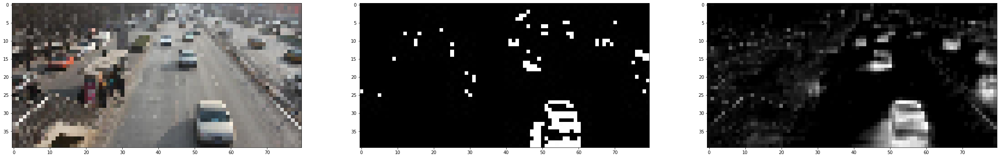

epoch [191/2000], loss_total:0.0381, time elapsed:7.0353 (sec)
epoch [192/2000], loss_total:0.0381, time elapsed:4.5227 (sec)
epoch [193/2000], loss_total:0.0380, time elapsed:4.7452 (sec)
epoch [194/2000], loss_total:0.0380, time elapsed:4.3233 (sec)
epoch [195/2000], loss_total:0.0379, time elapsed:4.7139 (sec)


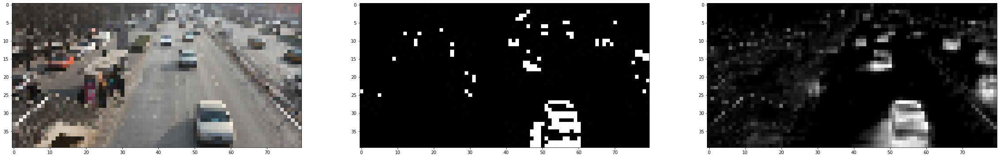

epoch [196/2000], loss_total:0.0379, time elapsed:6.9227 (sec)
epoch [197/2000], loss_total:0.0378, time elapsed:4.4585 (sec)
epoch [198/2000], loss_total:0.0378, time elapsed:4.3501 (sec)
epoch [199/2000], loss_total:0.0377, time elapsed:4.4500 (sec)
epoch [200/2000], loss_total:0.0377, time elapsed:4.2211 (sec)


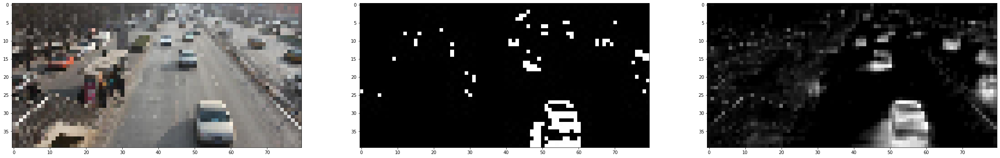

epoch [201/2000], loss_total:0.0376, time elapsed:6.7247 (sec)
epoch [202/2000], loss_total:0.0376, time elapsed:4.4022 (sec)
epoch [203/2000], loss_total:0.0375, time elapsed:4.6647 (sec)
epoch [204/2000], loss_total:0.0374, time elapsed:4.2760 (sec)
epoch [205/2000], loss_total:0.0374, time elapsed:4.4946 (sec)


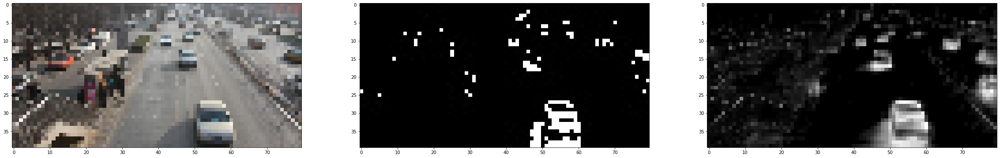

epoch [206/2000], loss_total:0.0374, time elapsed:6.9571 (sec)
epoch [207/2000], loss_total:0.0373, time elapsed:4.4886 (sec)
epoch [208/2000], loss_total:0.0372, time elapsed:4.5289 (sec)
epoch [209/2000], loss_total:0.0375, time elapsed:4.8773 (sec)
epoch [210/2000], loss_total:0.0370, time elapsed:4.2541 (sec)


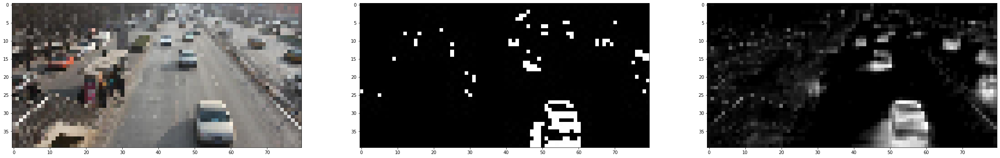

epoch [211/2000], loss_total:0.0371, time elapsed:7.2530 (sec)
epoch [212/2000], loss_total:0.0371, time elapsed:4.2293 (sec)
epoch [213/2000], loss_total:0.0370, time elapsed:4.1620 (sec)
epoch [214/2000], loss_total:0.0370, time elapsed:4.5397 (sec)
epoch [215/2000], loss_total:0.0369, time elapsed:4.3106 (sec)


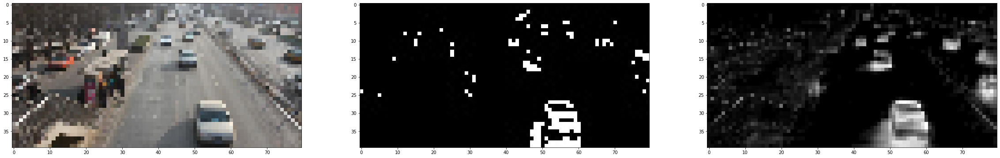

epoch [216/2000], loss_total:0.0368, time elapsed:7.2878 (sec)
epoch [217/2000], loss_total:0.0367, time elapsed:4.4631 (sec)
epoch [218/2000], loss_total:0.0366, time elapsed:4.7345 (sec)
epoch [219/2000], loss_total:0.0365, time elapsed:4.2083 (sec)
epoch [220/2000], loss_total:0.0365, time elapsed:4.5532 (sec)


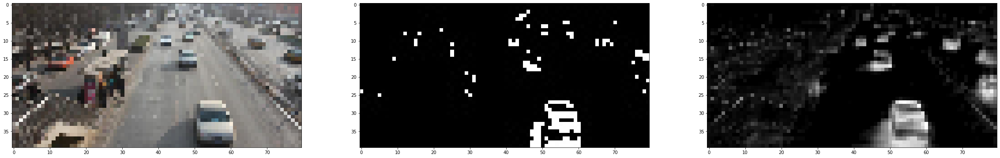

epoch [221/2000], loss_total:0.0364, time elapsed:6.6353 (sec)
epoch [222/2000], loss_total:0.0363, time elapsed:4.3132 (sec)
epoch [223/2000], loss_total:0.0362, time elapsed:4.4375 (sec)
epoch [224/2000], loss_total:0.0362, time elapsed:4.4211 (sec)
epoch [225/2000], loss_total:0.0360, time elapsed:4.2989 (sec)


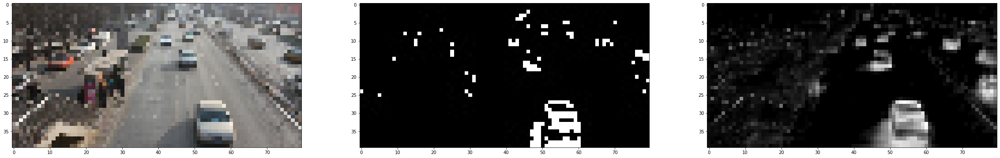

epoch [226/2000], loss_total:0.0359, time elapsed:6.9239 (sec)
epoch [227/2000], loss_total:0.0359, time elapsed:4.5543 (sec)
epoch [228/2000], loss_total:0.0358, time elapsed:4.6876 (sec)
epoch [229/2000], loss_total:0.0357, time elapsed:4.1911 (sec)
epoch [230/2000], loss_total:0.0356, time elapsed:4.4353 (sec)


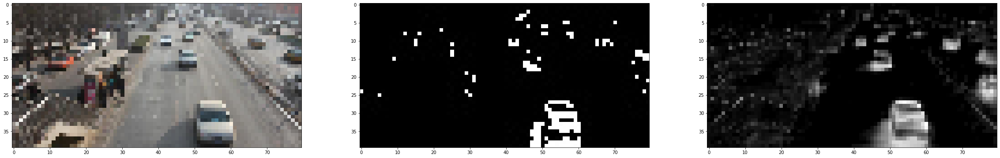

epoch [231/2000], loss_total:0.0355, time elapsed:6.7334 (sec)
epoch [232/2000], loss_total:0.0355, time elapsed:4.3652 (sec)
epoch [233/2000], loss_total:0.0354, time elapsed:4.7127 (sec)
epoch [234/2000], loss_total:0.0353, time elapsed:4.7893 (sec)
epoch [235/2000], loss_total:0.0352, time elapsed:4.6437 (sec)


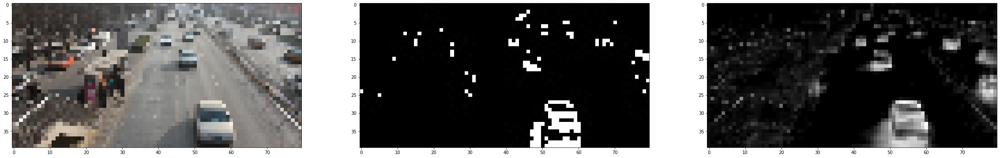

epoch [236/2000], loss_total:0.0351, time elapsed:7.1789 (sec)
epoch [237/2000], loss_total:0.0350, time elapsed:4.3676 (sec)
epoch [238/2000], loss_total:0.0349, time elapsed:4.7372 (sec)
epoch [239/2000], loss_total:0.0349, time elapsed:4.4918 (sec)
epoch [240/2000], loss_total:0.0346, time elapsed:4.5156 (sec)


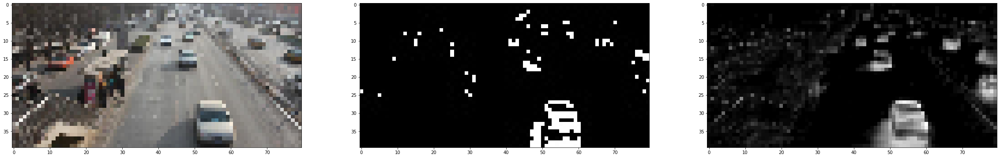

epoch [241/2000], loss_total:0.0347, time elapsed:7.0390 (sec)
epoch [242/2000], loss_total:0.0348, time elapsed:4.7695 (sec)
epoch [243/2000], loss_total:0.0347, time elapsed:4.3971 (sec)
epoch [244/2000], loss_total:0.0346, time elapsed:4.3380 (sec)
epoch [245/2000], loss_total:0.0346, time elapsed:4.4883 (sec)


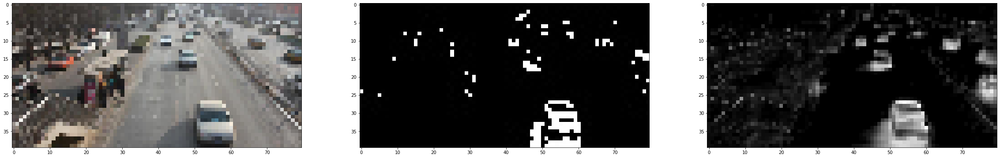

epoch [246/2000], loss_total:0.0345, time elapsed:7.5529 (sec)
epoch [247/2000], loss_total:0.0345, time elapsed:4.9280 (sec)
epoch [248/2000], loss_total:0.0344, time elapsed:4.2884 (sec)
epoch [249/2000], loss_total:0.0343, time elapsed:4.7309 (sec)
epoch [250/2000], loss_total:0.0342, time elapsed:4.3038 (sec)


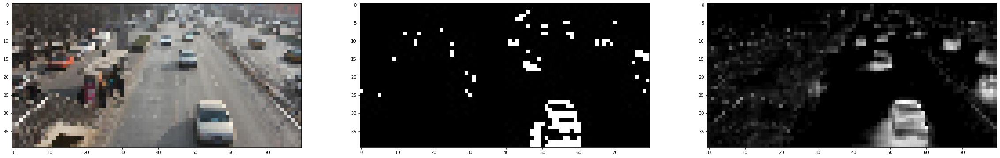

epoch [251/2000], loss_total:0.0342, time elapsed:7.0730 (sec)
epoch [252/2000], loss_total:0.0341, time elapsed:4.5185 (sec)
epoch [253/2000], loss_total:0.0341, time elapsed:4.4816 (sec)
epoch [254/2000], loss_total:0.0340, time elapsed:4.4063 (sec)
epoch [255/2000], loss_total:0.0340, time elapsed:5.0250 (sec)


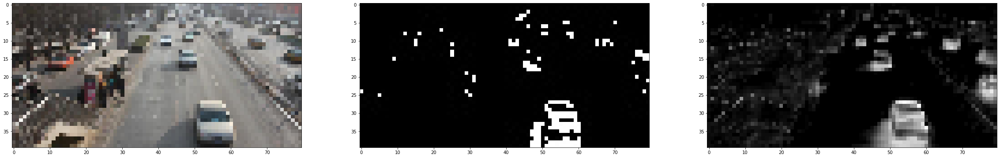

epoch [256/2000], loss_total:0.0339, time elapsed:6.7812 (sec)
epoch [257/2000], loss_total:0.0338, time elapsed:4.9435 (sec)
epoch [258/2000], loss_total:0.0338, time elapsed:4.3085 (sec)
epoch [259/2000], loss_total:0.0337, time elapsed:4.3756 (sec)
epoch [260/2000], loss_total:0.0336, time elapsed:4.2251 (sec)


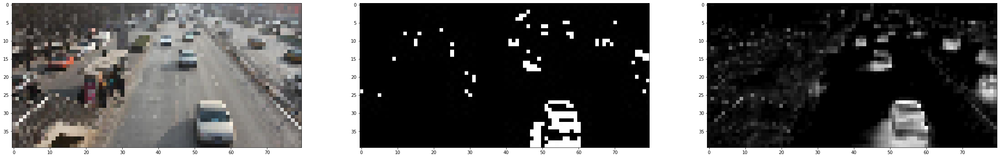

epoch [261/2000], loss_total:0.0336, time elapsed:7.2852 (sec)
epoch [262/2000], loss_total:0.0335, time elapsed:4.7141 (sec)
epoch [263/2000], loss_total:0.0335, time elapsed:4.6570 (sec)
epoch [264/2000], loss_total:0.0334, time elapsed:4.4313 (sec)
epoch [265/2000], loss_total:0.0334, time elapsed:4.1494 (sec)


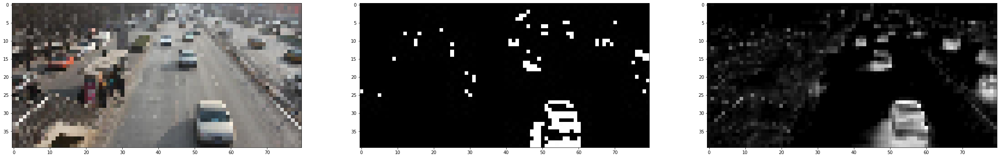

epoch [266/2000], loss_total:0.0333, time elapsed:6.9496 (sec)
epoch [267/2000], loss_total:0.0332, time elapsed:4.3333 (sec)
epoch [268/2000], loss_total:0.0332, time elapsed:4.6283 (sec)
epoch [269/2000], loss_total:0.0332, time elapsed:4.3947 (sec)
epoch [270/2000], loss_total:0.0331, time elapsed:4.2910 (sec)


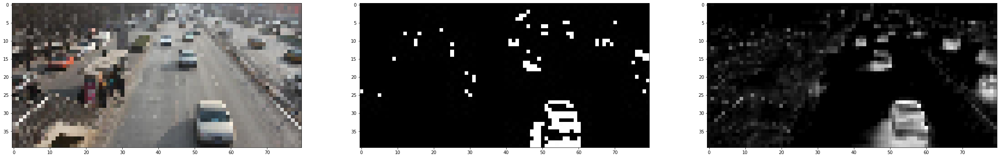

epoch [271/2000], loss_total:0.0331, time elapsed:6.9021 (sec)
epoch [272/2000], loss_total:0.0330, time elapsed:4.3501 (sec)
epoch [273/2000], loss_total:0.0330, time elapsed:4.3547 (sec)
epoch [274/2000], loss_total:0.0329, time elapsed:4.8121 (sec)
epoch [275/2000], loss_total:0.0329, time elapsed:4.8215 (sec)


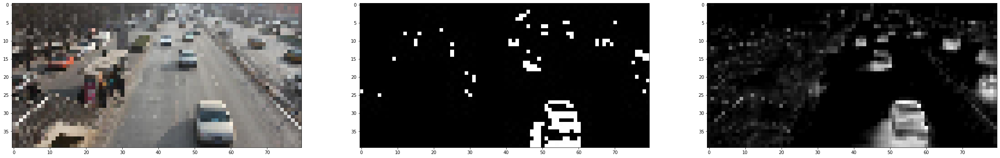

epoch [276/2000], loss_total:0.0328, time elapsed:6.7719 (sec)
epoch [277/2000], loss_total:0.0328, time elapsed:4.5505 (sec)
epoch [278/2000], loss_total:0.0328, time elapsed:4.6157 (sec)
epoch [279/2000], loss_total:0.0327, time elapsed:4.3757 (sec)
epoch [280/2000], loss_total:0.0327, time elapsed:4.2459 (sec)


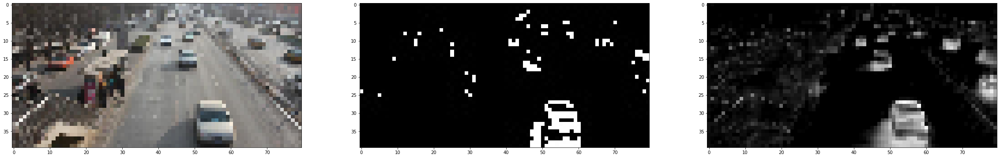

epoch [281/2000], loss_total:0.0329, time elapsed:6.5602 (sec)
epoch [282/2000], loss_total:0.0331, time elapsed:4.6717 (sec)
epoch [283/2000], loss_total:0.0327, time elapsed:4.2862 (sec)
epoch [284/2000], loss_total:0.0326, time elapsed:4.4683 (sec)
epoch [285/2000], loss_total:0.0326, time elapsed:4.2861 (sec)


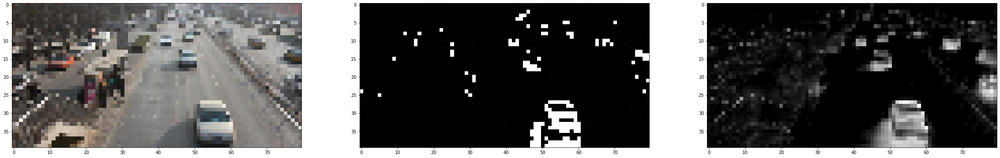

epoch [286/2000], loss_total:0.0326, time elapsed:6.9503 (sec)
epoch [287/2000], loss_total:0.0325, time elapsed:4.1533 (sec)
epoch [288/2000], loss_total:0.0325, time elapsed:4.2442 (sec)
epoch [289/2000], loss_total:0.0325, time elapsed:4.2154 (sec)
epoch [290/2000], loss_total:0.0324, time elapsed:4.3241 (sec)


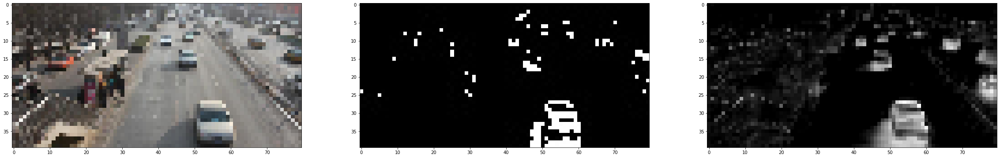

epoch [291/2000], loss_total:0.0324, time elapsed:6.7957 (sec)
epoch [292/2000], loss_total:0.0324, time elapsed:4.7175 (sec)
epoch [293/2000], loss_total:0.0323, time elapsed:4.3210 (sec)
epoch [294/2000], loss_total:0.0323, time elapsed:4.3373 (sec)
epoch [295/2000], loss_total:0.0323, time elapsed:4.2825 (sec)


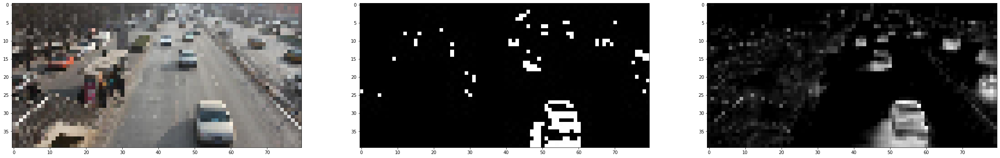

epoch [296/2000], loss_total:0.0323, time elapsed:6.8948 (sec)
epoch [297/2000], loss_total:0.0322, time elapsed:4.7100 (sec)
epoch [298/2000], loss_total:0.0322, time elapsed:4.5011 (sec)
epoch [299/2000], loss_total:0.0322, time elapsed:4.5415 (sec)
epoch [300/2000], loss_total:0.0322, time elapsed:4.7627 (sec)


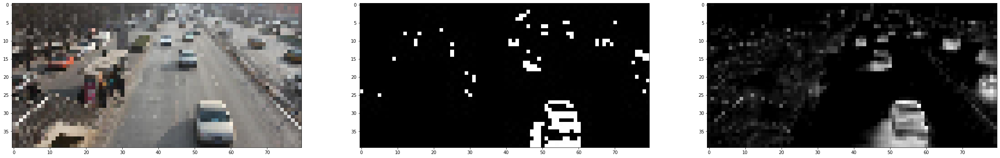

epoch [301/2000], loss_total:0.0321, time elapsed:7.4396 (sec)
epoch [302/2000], loss_total:0.0321, time elapsed:4.8059 (sec)
epoch [303/2000], loss_total:0.0321, time elapsed:4.4609 (sec)
epoch [304/2000], loss_total:0.0321, time elapsed:4.5216 (sec)
epoch [305/2000], loss_total:0.0320, time elapsed:4.1647 (sec)


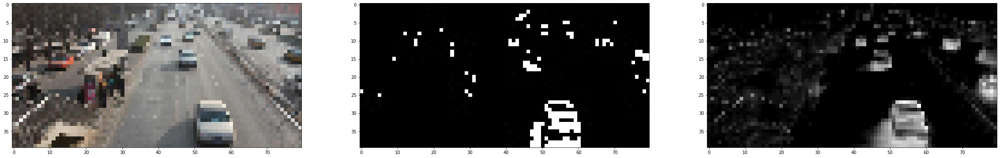

epoch [306/2000], loss_total:0.0320, time elapsed:7.1614 (sec)
epoch [307/2000], loss_total:0.0320, time elapsed:4.9076 (sec)
epoch [308/2000], loss_total:0.0320, time elapsed:4.5090 (sec)
epoch [309/2000], loss_total:0.0319, time elapsed:4.6185 (sec)
epoch [310/2000], loss_total:0.0319, time elapsed:4.5038 (sec)


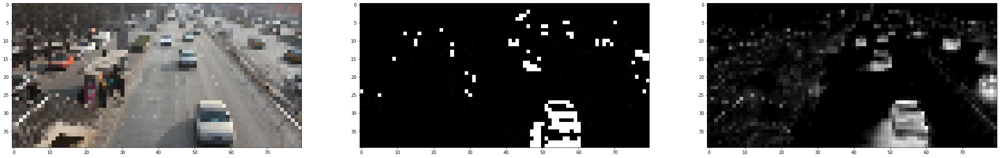

epoch [311/2000], loss_total:0.0319, time elapsed:7.1361 (sec)
epoch [312/2000], loss_total:0.0319, time elapsed:4.3982 (sec)
epoch [313/2000], loss_total:0.0319, time elapsed:4.3618 (sec)
epoch [314/2000], loss_total:0.0318, time elapsed:4.2994 (sec)
epoch [315/2000], loss_total:0.0318, time elapsed:4.4753 (sec)


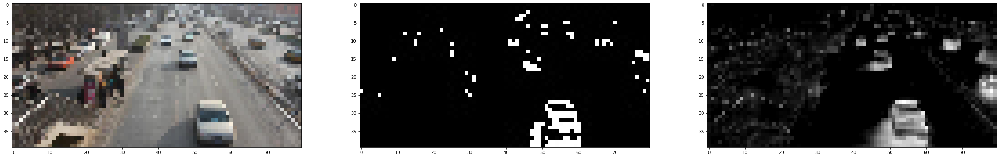

epoch [316/2000], loss_total:0.0318, time elapsed:6.8862 (sec)
epoch [317/2000], loss_total:0.0318, time elapsed:4.8179 (sec)
epoch [318/2000], loss_total:0.0318, time elapsed:4.4327 (sec)
epoch [319/2000], loss_total:0.0317, time elapsed:4.8171 (sec)
epoch [320/2000], loss_total:0.0317, time elapsed:4.4308 (sec)


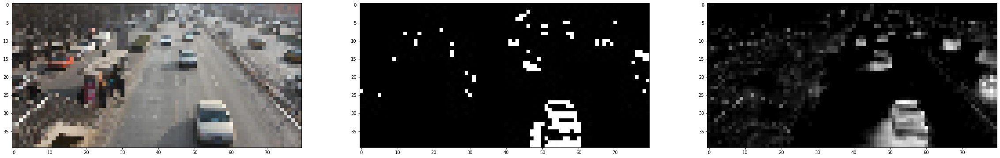

epoch [321/2000], loss_total:0.0317, time elapsed:6.8021 (sec)
epoch [322/2000], loss_total:0.0317, time elapsed:4.7923 (sec)
epoch [323/2000], loss_total:0.0316, time elapsed:4.2402 (sec)
epoch [324/2000], loss_total:0.0316, time elapsed:4.3254 (sec)
epoch [325/2000], loss_total:0.0316, time elapsed:4.5121 (sec)


Traceback (most recent call last):
Traceback (most recent call last):
  File "/nethome/jbang36/anaconda3/envs/eva_37/lib/python3.7/multiprocessing/queues.py", line 242, in _feed
    send_bytes(obj)
  File "/nethome/jbang36/anaconda3/envs/eva_37/lib/python3.7/multiprocessing/connection.py", line 200, in send_bytes
    self._send_bytes(m[offset:offset + size])
  File "/nethome/jbang36/anaconda3/envs/eva_37/lib/python3.7/multiprocessing/connection.py", line 404, in _send_bytes
    self._send(header + buf)
  File "/nethome/jbang36/anaconda3/envs/eva_37/lib/python3.7/multiprocessing/connection.py", line 368, in _send
    n = write(self._handle, buf)
BrokenPipeError: [Errno 32] Broken pipe
  File "/nethome/jbang36/anaconda3/envs/eva_37/lib/python3.7/multiprocessing/queues.py", line 242, in _feed
    send_bytes(obj)
  File "/nethome/jbang36/anaconda3/envs/eva_37/lib/python3.7/multiprocessing/connection.py", line 200, in send_bytes
    self._send_bytes(m[offset:offset + size])
  File "/nethome

KeyboardInterrupt: 

In [42]:
## Paper training stats
# learning_rate = 0.003
# dropout rate is 0.65
# batch size is 10
# learning rate dropped by 10 every 1000 iteration
# training stopped at 50000 iterations (assuming this is epoch)
learning_rate = 0.0001 # our loop starts by dividing 10
total_epochs = 2000
l2_reg = 1e-5


optimizer = torch.optim.Adam(model.parameters(), lr=learning_rate, weight_decay = l2_reg)
loss_amp_factor = 1
#optimizer = torch.optim.SGD(model.parameters(),lr=learning_rate, momentum=0.9)
for epoch in range(total_epochs):
 #   if epoch % 1000 == 0:
 #       optimizer = torch.optim.SGD(model.parameters(),lr=learning_rate, momentum=0.9)
    
    st = time.perf_counter()
    for i, images in enumerate(train_loader):    # Ignore image labels
        #generate hsv images
        #hsv_images = torch.from_numpy(cv2.cvtColor(images, cv2.COLOR_RGB2HSV))
        #hsv_images_cuda = hsv_images.cuda()
        images_cuda = images.cuda()
        images_input_cuda = images_cuda[:,:3,:,:]
        images_output_cuda = images_cuda[:,3:,:,:]
        
        
        compressed, final = model(images_input_cuda)  
        #print_grad("Before zero_grad") ##
        #if softmax, we need to process the final layer -> perform argmax operations 
        #channels is 1
        
        
        
        
        optimizer.zero_grad()
        #final = background + foreground
        #final[final > 1] = 1
        #final[final < 0] = 0
        loss_all = distance(final, images_output_cuda)
        loss_all.backward()
        #print_grad("After 2nd loss backward")
        optimizer.step()
        #print_grad("After 2nd grad application")
        
        # while training, I want to investigate how my images change...so let's write code for that
        if epoch % 5 == 0 and i == 1:
            original_cpu = convert_one(images_output_cuda)
            final_cpu = convert_one(final)
            images_cpu = convert(images_input_cuda)
            
            
            fig = plt.figure(figsize=(40,80))
            columns = 3
            rows = 1
            for j in range(columns):
                fig.add_subplot(rows,columns,j + 1)
                if j == 0:
                    plt.imshow(images_cpu[0])
                if j == 1:
                    plt.imshow(original_cpu[0], cmap = 'gray')
                if j == 2:
                    plt.imshow(final_cpu[0], cmap = 'gray')
           
            plt.show()

    print('epoch [{}/{}], loss_total:{:.4f}, time elapsed:{:.4f} (sec)'.format(epoch+1, total_epochs, loss_all.data, time.perf_counter() - st))
    

torch.Size([2085, 40, 80, 1])
torch.Size([2085, 1, 40, 80])
image number => 0
image number => 0
image number => 0


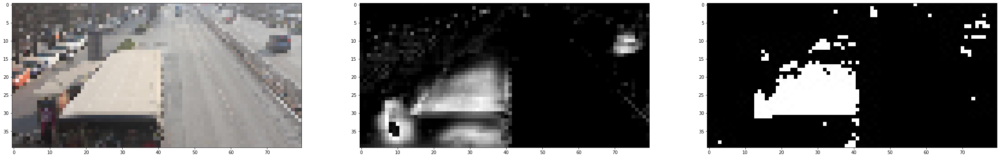

image number => 20
image number => 20
image number => 20


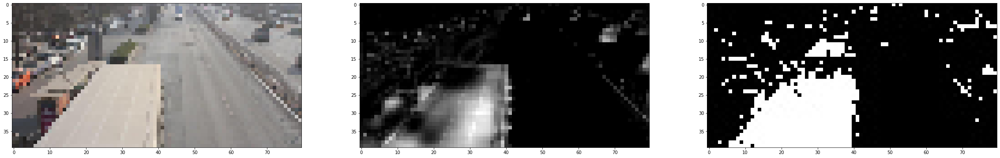

image number => 40
image number => 40
image number => 40


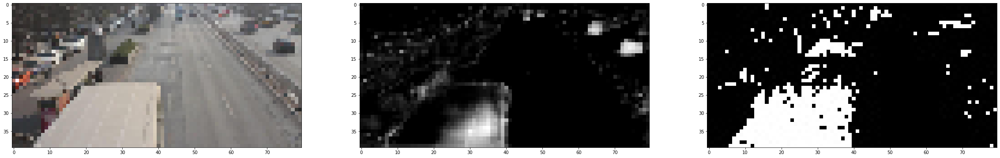

image number => 60
image number => 60
image number => 60


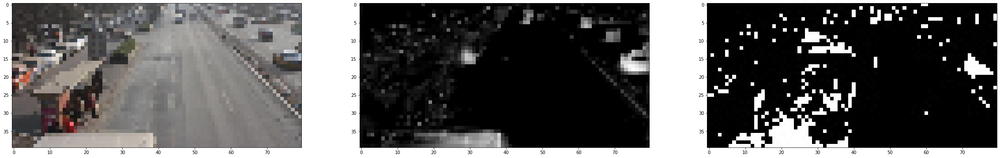

image number => 0
image number => 0
image number => 0


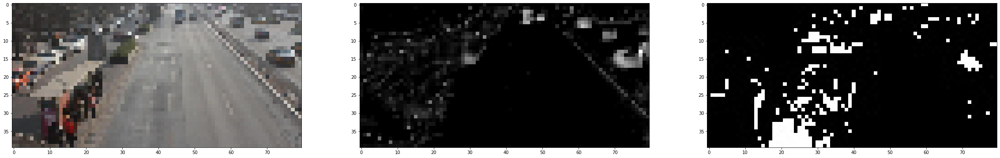

image number => 20
image number => 20
image number => 20


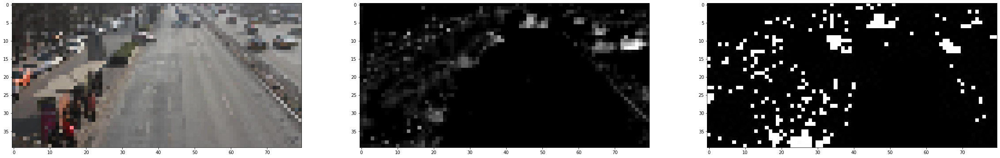

image number => 40
image number => 40
image number => 40


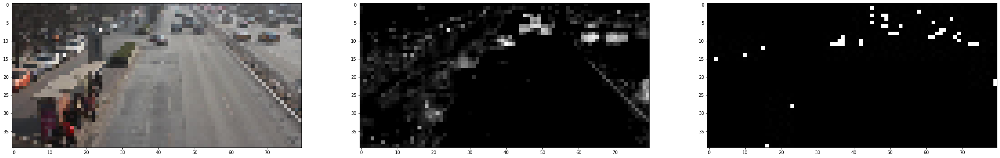

image number => 60
image number => 60
image number => 60


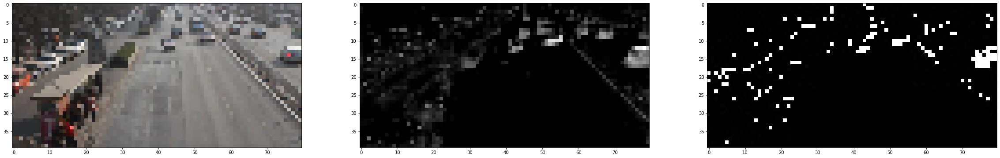

image number => 0
image number => 0
image number => 0


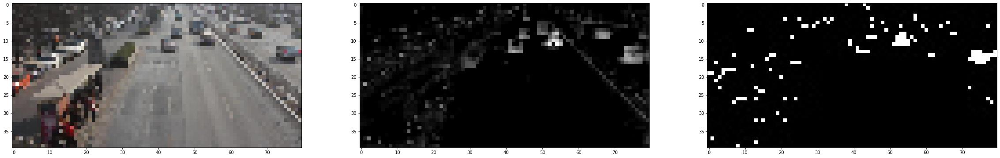

image number => 20
image number => 20
image number => 20


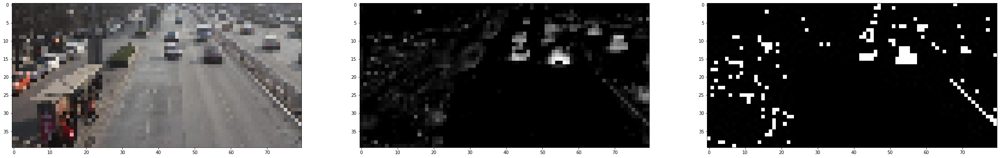

image number => 40
image number => 40
image number => 40


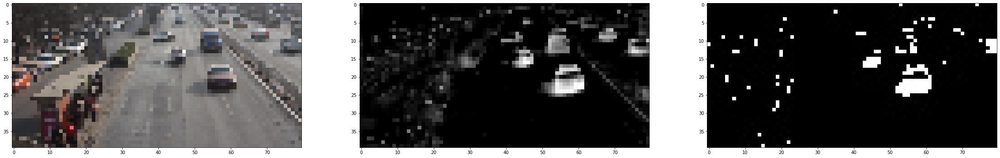

image number => 60
image number => 60
image number => 60


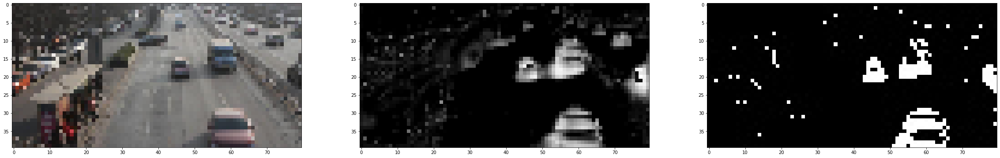

image number => 0
image number => 0
image number => 0


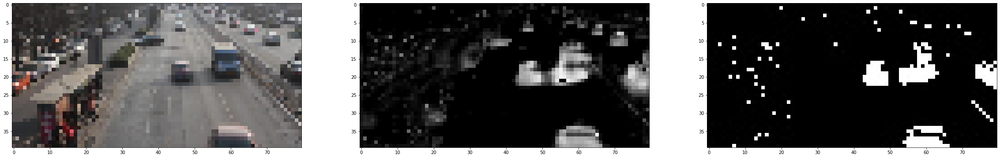

image number => 20
image number => 20
image number => 20


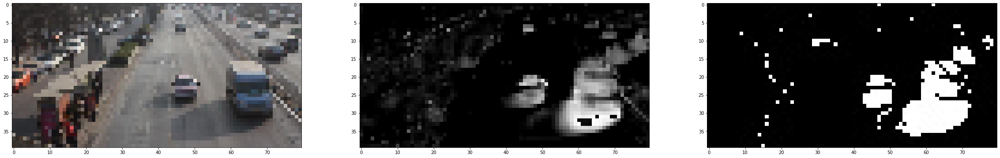

image number => 40
image number => 40
image number => 40


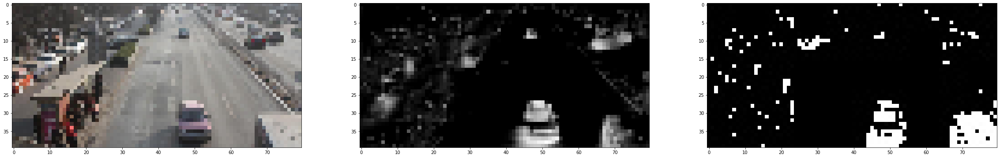

image number => 60
image number => 60
image number => 60


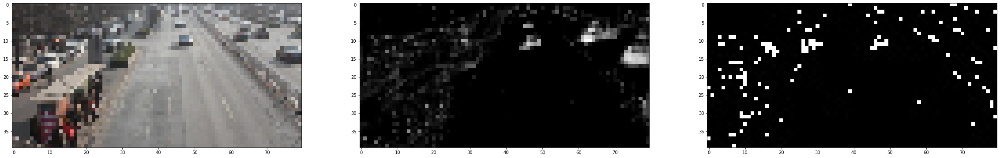

image number => 0
image number => 0
image number => 0


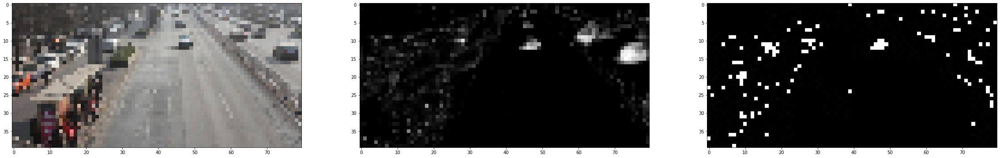

image number => 20
image number => 20
image number => 20


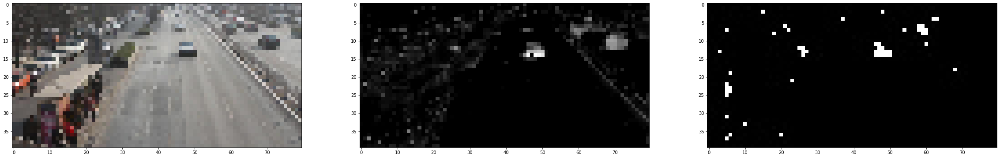

image number => 40
image number => 40
image number => 40


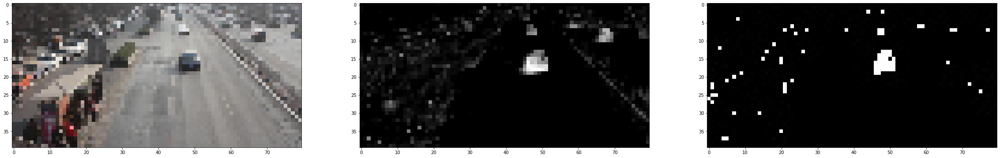

image number => 60
image number => 60
image number => 60


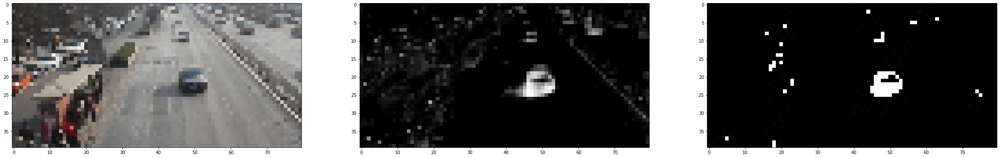

image number => 0
image number => 0
image number => 0


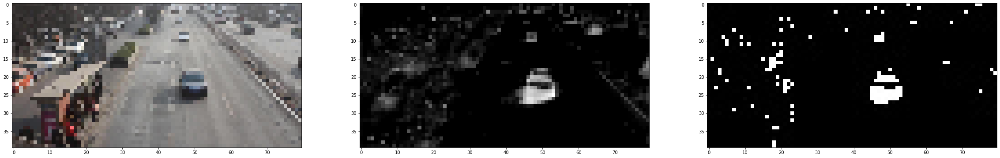

image number => 20
image number => 20
image number => 20


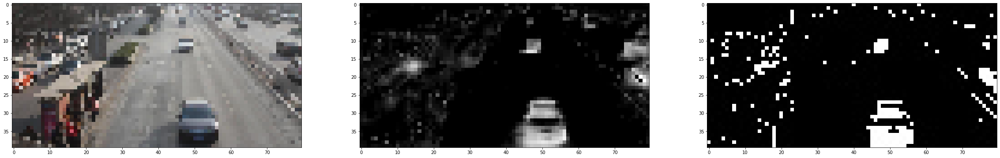

image number => 40
image number => 40
image number => 40


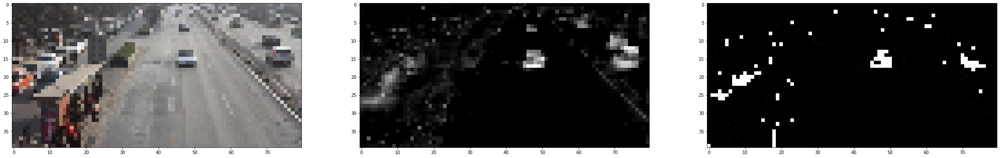

image number => 60
image number => 60
image number => 60


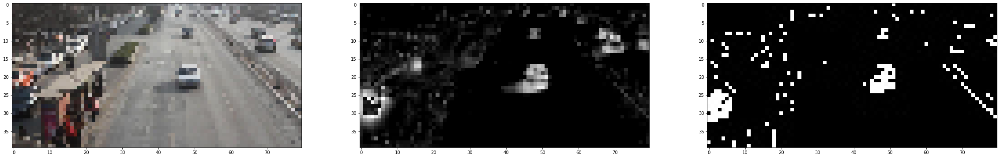

image number => 0
image number => 0
image number => 0


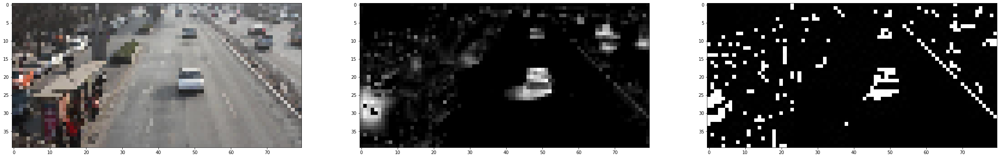

image number => 20
image number => 20
image number => 20


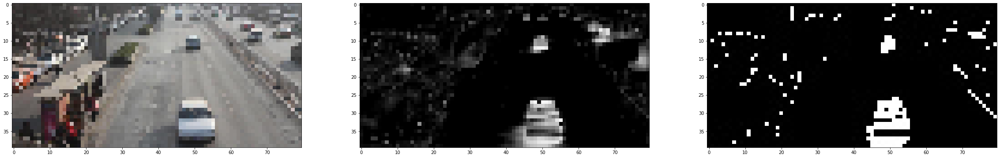

image number => 40
image number => 40
image number => 40


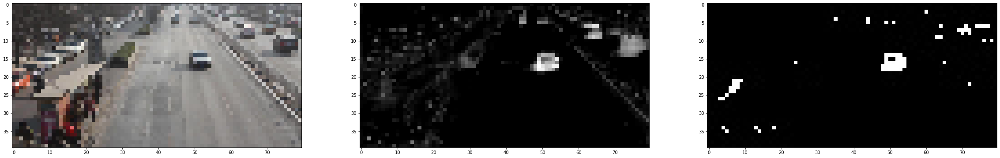

image number => 60
image number => 60
image number => 60


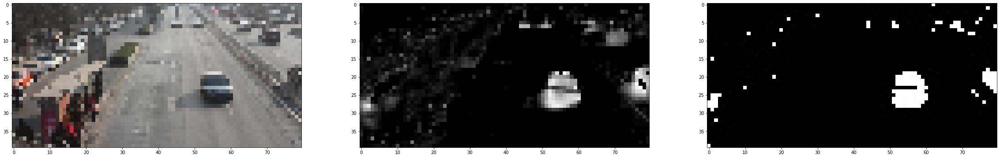

image number => 0
image number => 0
image number => 0


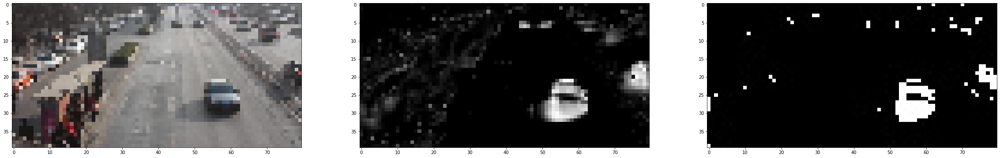

image number => 20
image number => 20
image number => 20


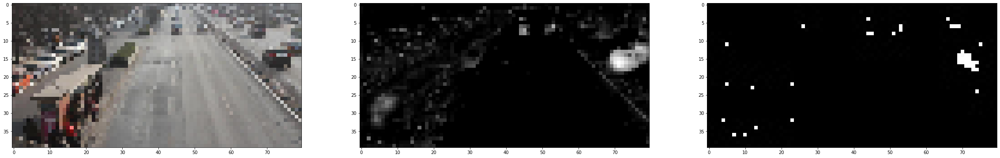

image number => 40
image number => 40
image number => 40


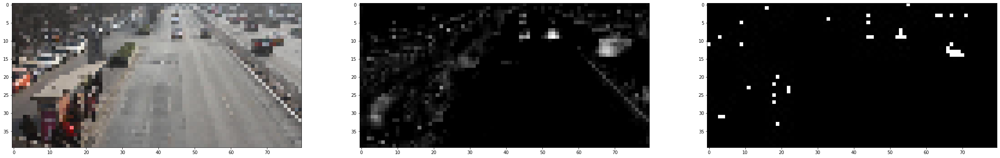

image number => 60
image number => 60
image number => 60


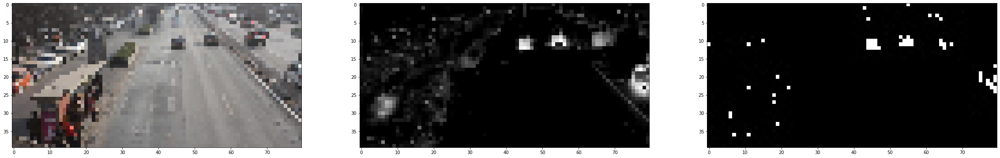

image number => 0
image number => 0
image number => 0


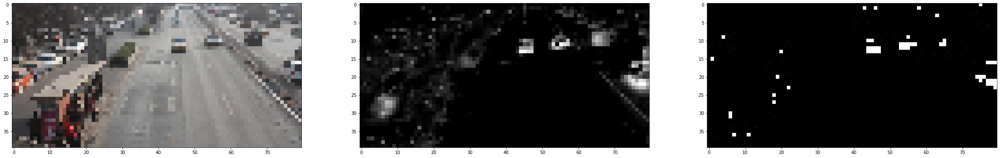

image number => 20
image number => 20
image number => 20


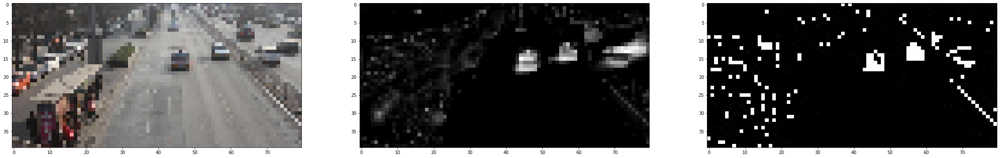

image number => 40
image number => 40
image number => 40


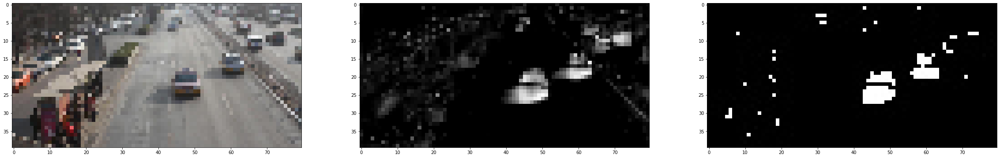

image number => 60
image number => 60
image number => 60


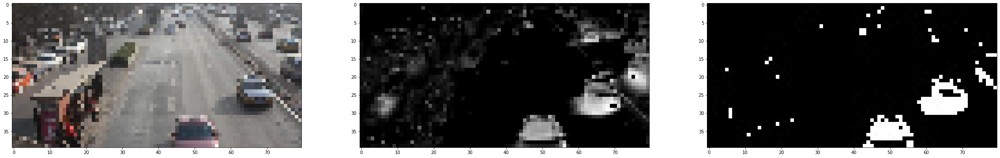

image number => 0
image number => 0
image number => 0


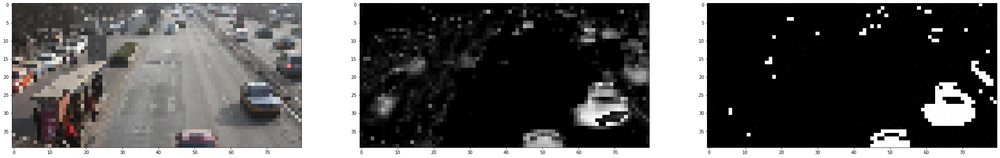

image number => 20
image number => 20
image number => 20


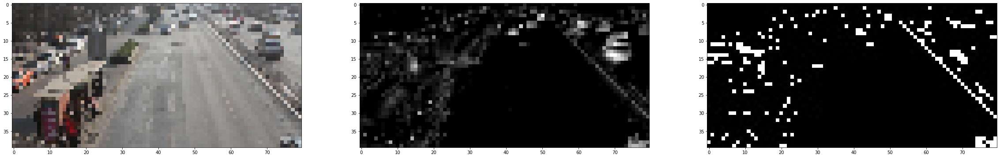

image number => 40
image number => 40
image number => 40


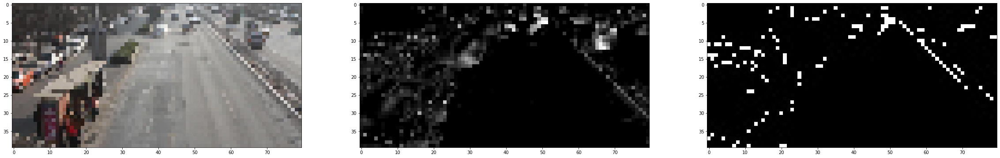

image number => 60
image number => 60
image number => 60


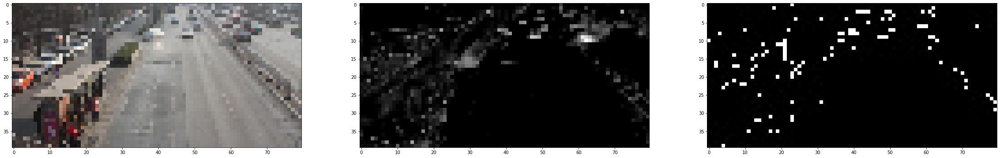

image number => 0
image number => 0
image number => 0


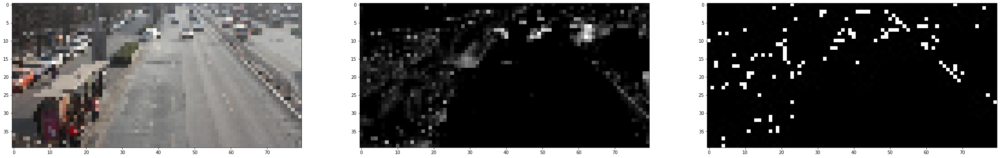

image number => 20
image number => 20
image number => 20


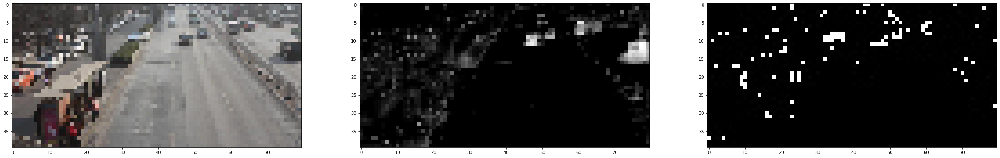

image number => 40
image number => 40
image number => 40


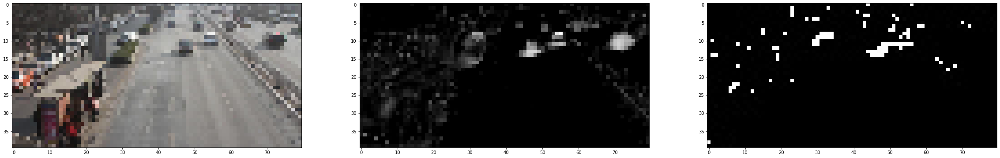

image number => 60
image number => 60
image number => 60


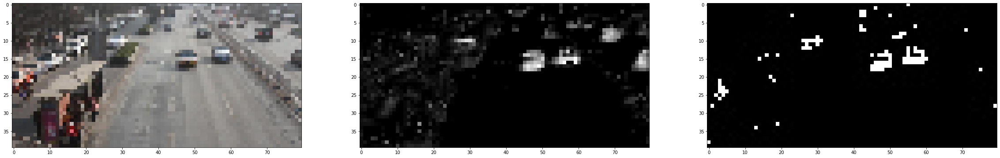

image number => 0
image number => 0
image number => 0


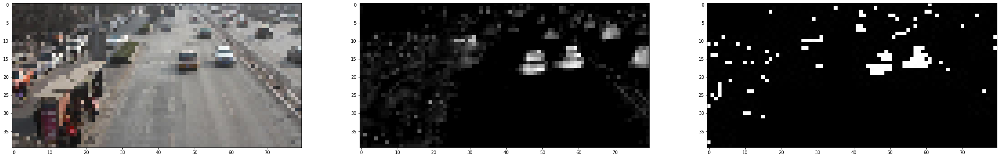

image number => 20
image number => 20
image number => 20


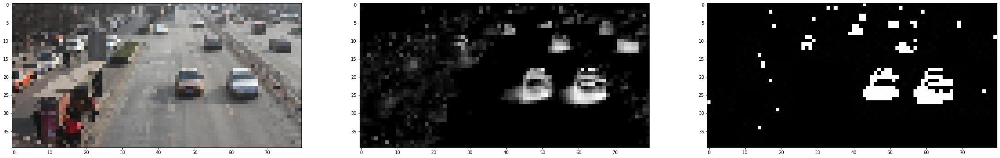

image number => 40
image number => 40
image number => 40


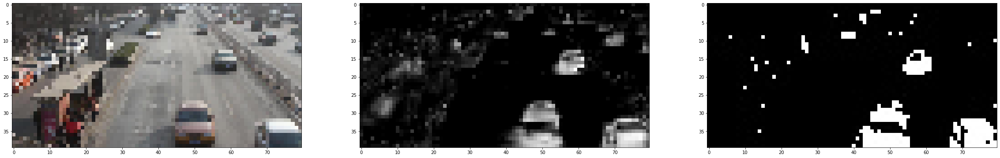

image number => 60
image number => 60
image number => 60


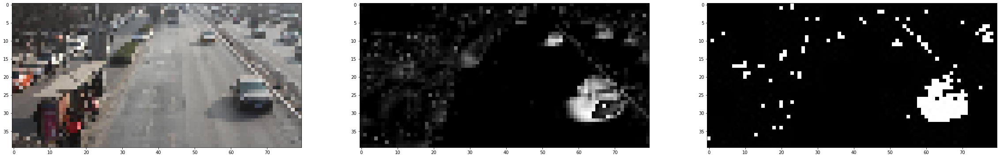

image number => 0
image number => 0
image number => 0


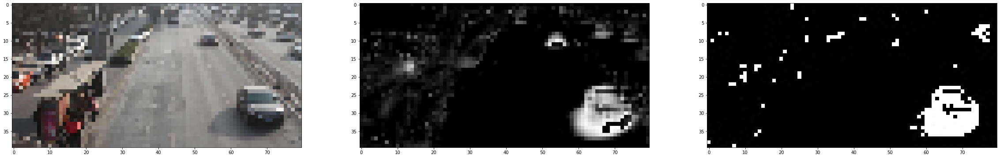

image number => 20
image number => 20
image number => 20


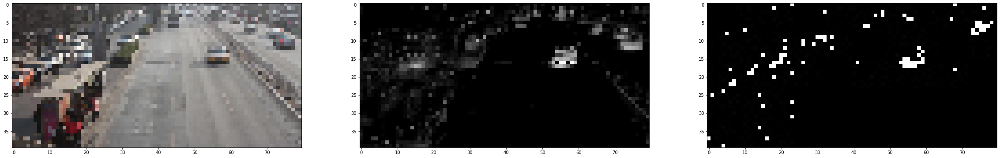

image number => 40
image number => 40
image number => 40


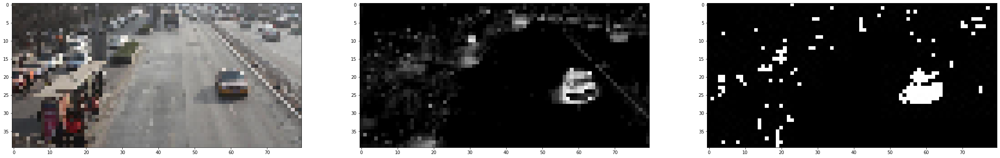

image number => 60
image number => 60
image number => 60


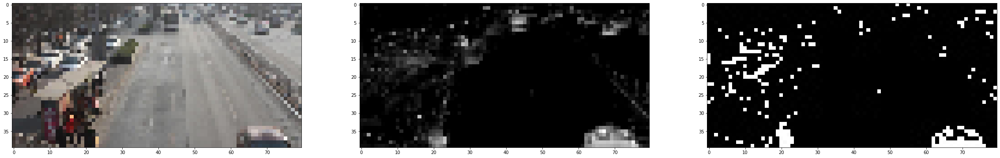

image number => 0
image number => 0
image number => 0


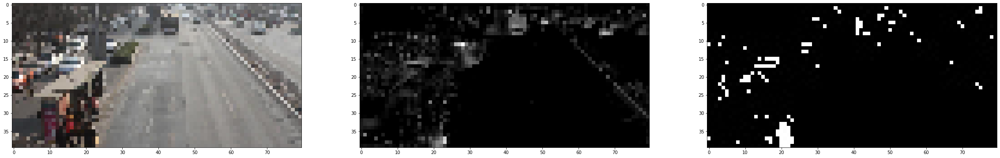

image number => 20
image number => 20
image number => 20


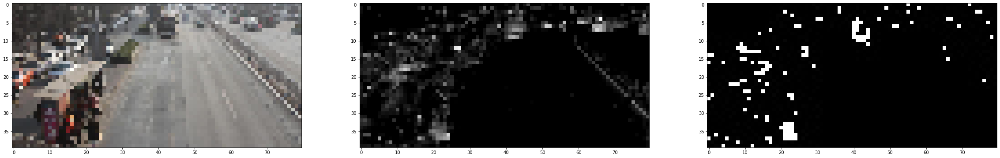

image number => 40
image number => 40
image number => 40


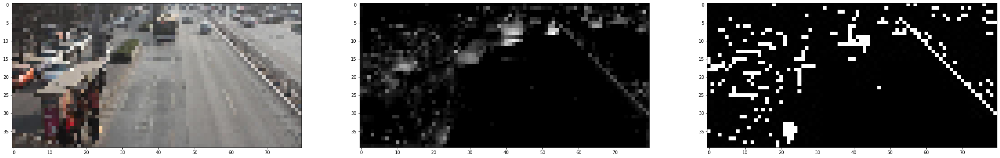

image number => 60
image number => 60
image number => 60


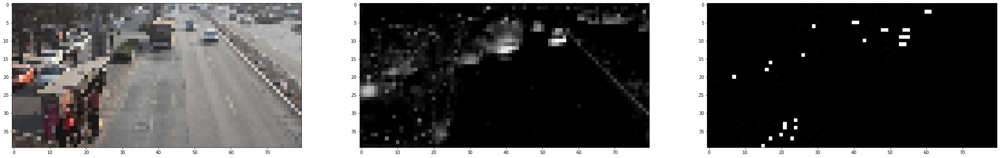

image number => 0
image number => 0
image number => 0


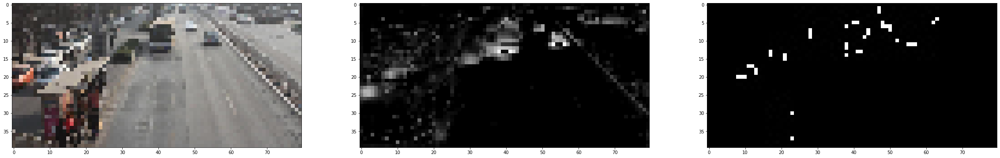

image number => 20
image number => 20
image number => 20


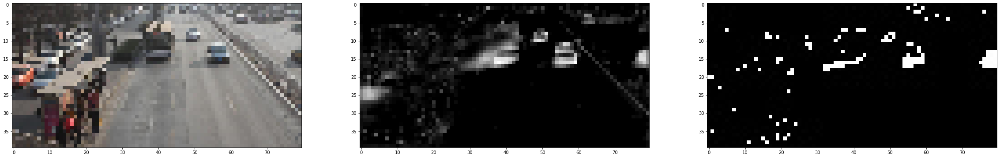

image number => 40
image number => 40
image number => 40


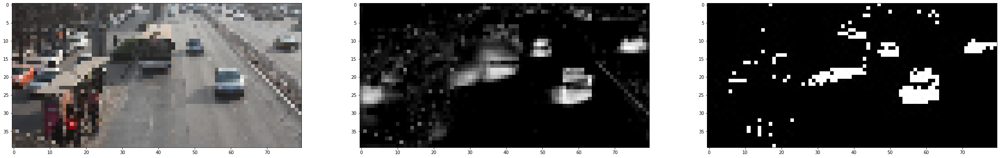

image number => 60
image number => 60
image number => 60


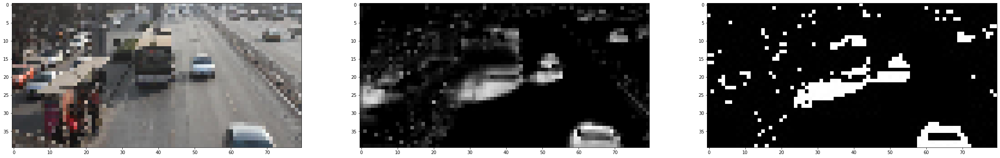

image number => 0
image number => 0
image number => 0


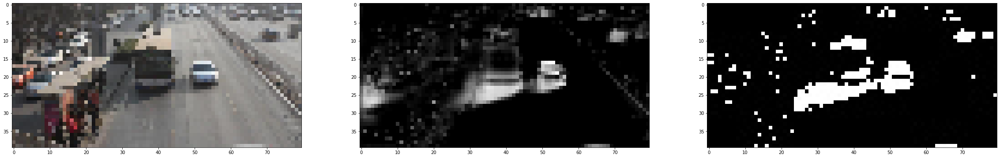

image number => 20
image number => 20
image number => 20


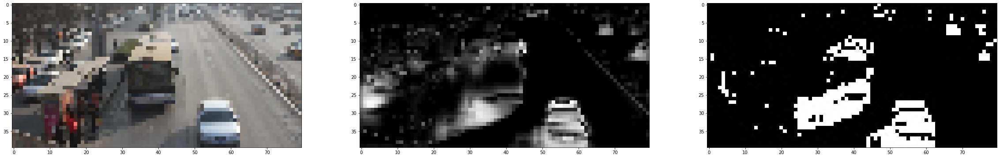

image number => 40
image number => 40
image number => 40


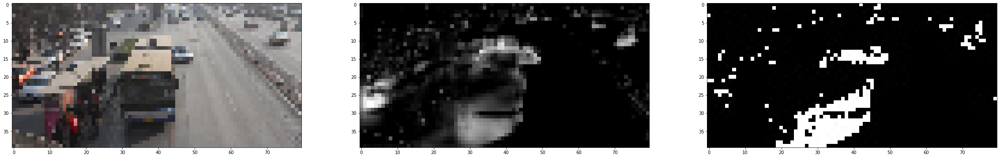

image number => 60
image number => 60
image number => 60


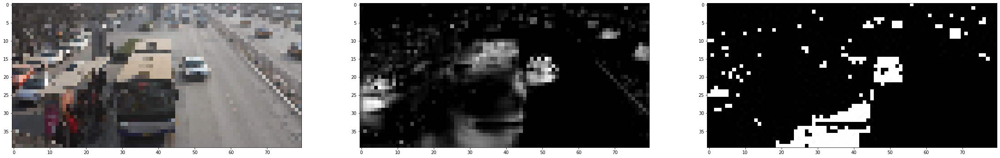

image number => 0
image number => 0
image number => 0


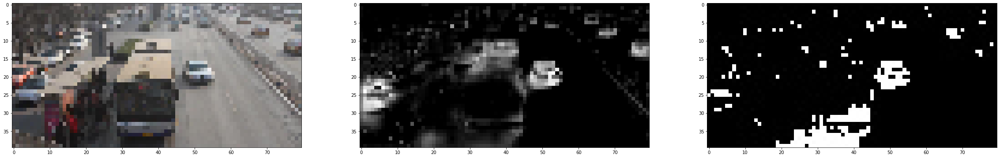

image number => 20
image number => 20
image number => 20


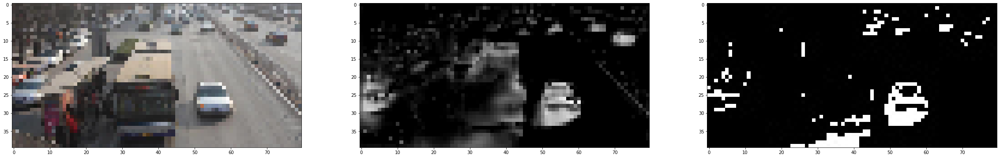

image number => 40
image number => 40
image number => 40


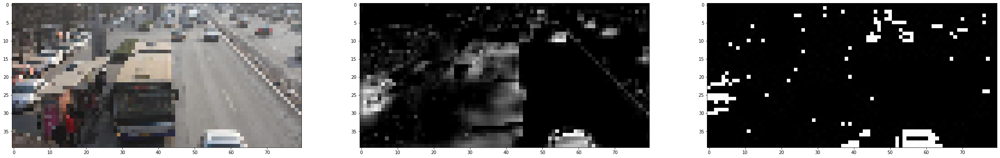

image number => 60
image number => 60
image number => 60


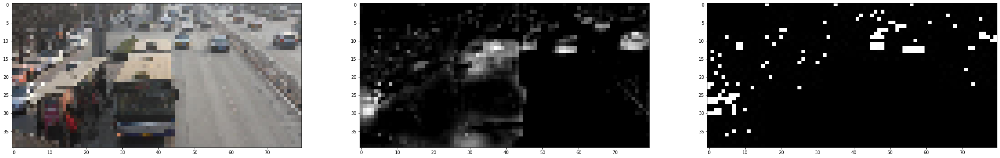

image number => 0
image number => 0
image number => 0


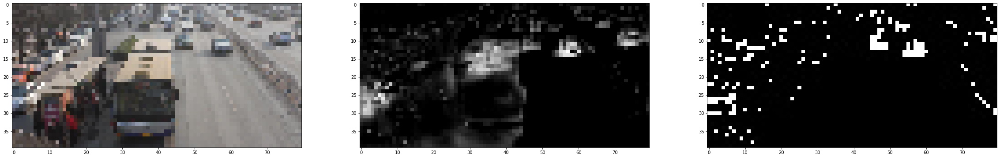

image number => 20
image number => 20
image number => 20


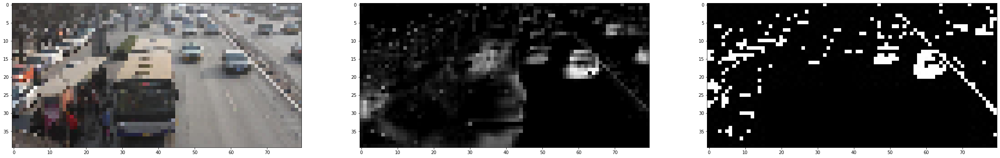

image number => 40
image number => 40
image number => 40


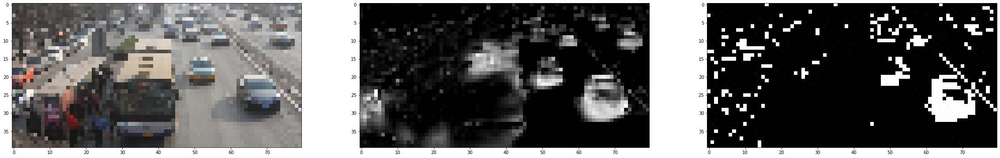

image number => 60
image number => 60
image number => 60


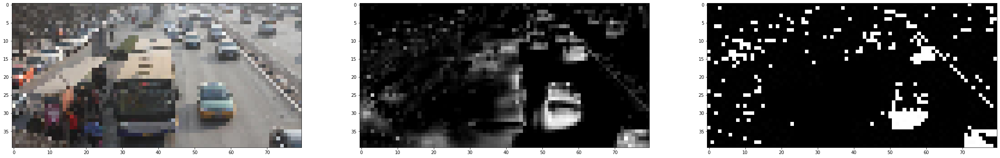

image number => 0
image number => 0
image number => 0


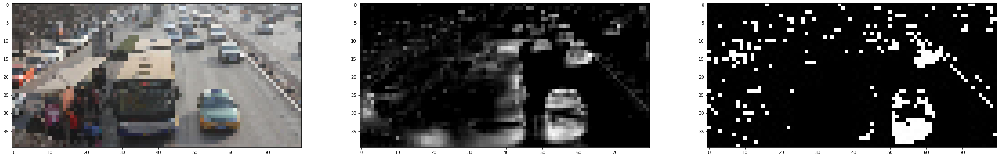

image number => 20
image number => 20
image number => 20


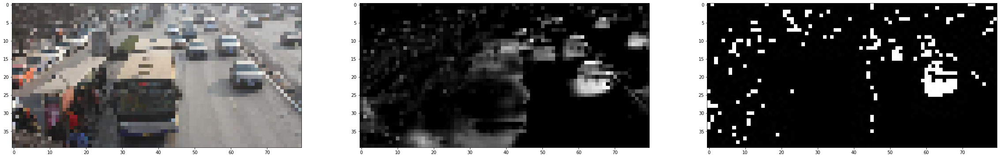

image number => 40
image number => 40
image number => 40


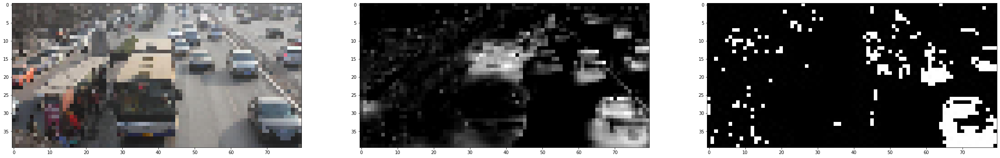

image number => 60
image number => 60
image number => 60


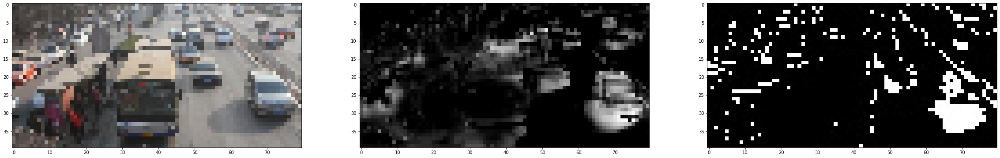

image number => 0
image number => 0
image number => 0


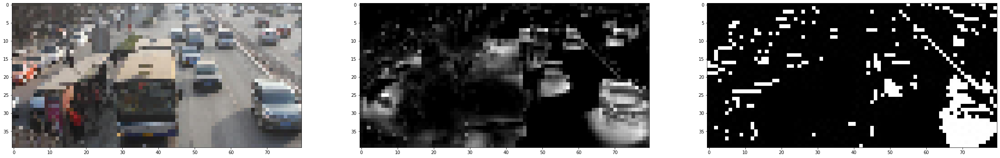

image number => 20
image number => 20
image number => 20


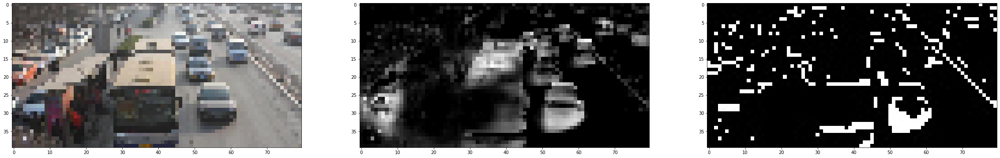

image number => 40
image number => 40
image number => 40


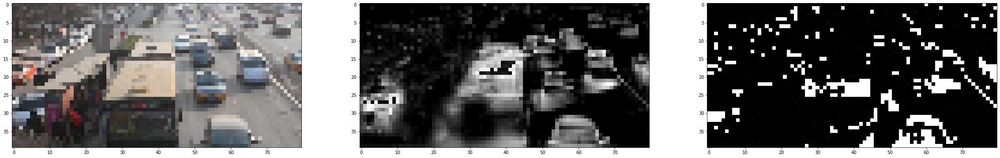

image number => 60
image number => 60
image number => 60


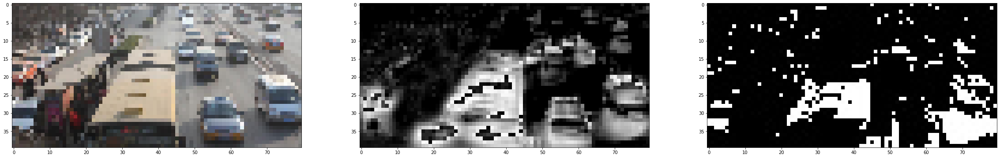

image number => 0
image number => 0
image number => 0


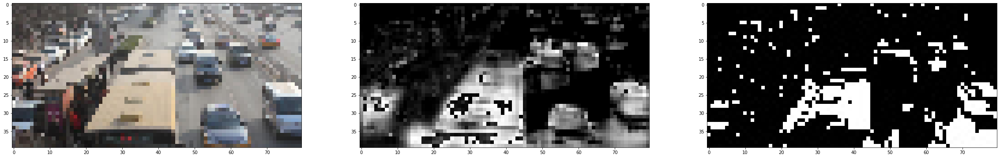

image number => 20
image number => 20
image number => 20


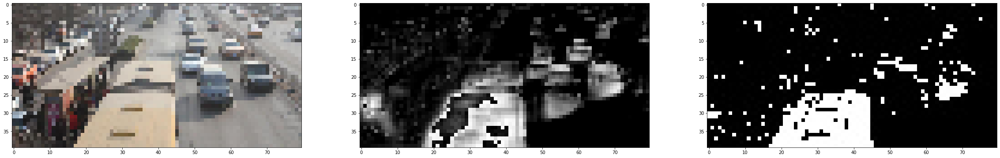

image number => 40
image number => 40
image number => 40


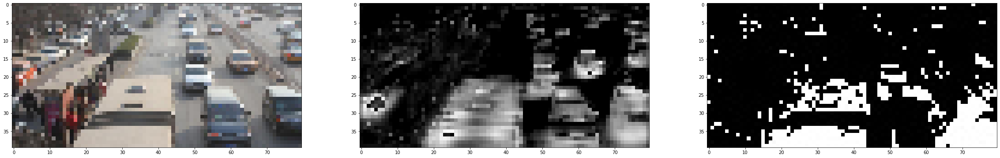

image number => 60
image number => 60
image number => 60


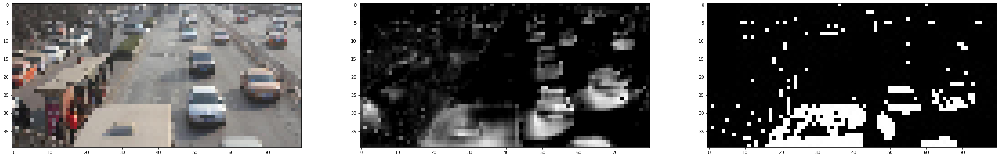

image number => 0
image number => 0
image number => 0


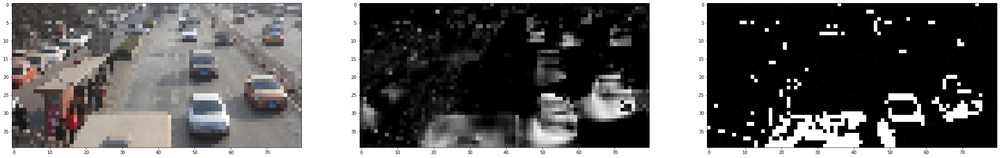

image number => 20
image number => 20
image number => 20


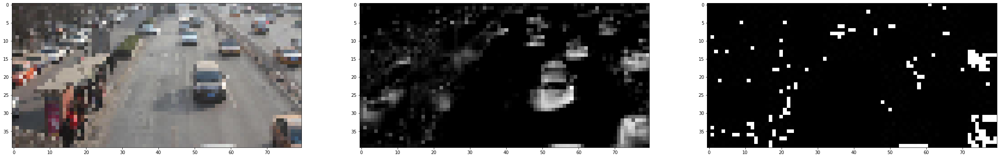

image number => 40
image number => 40
image number => 40


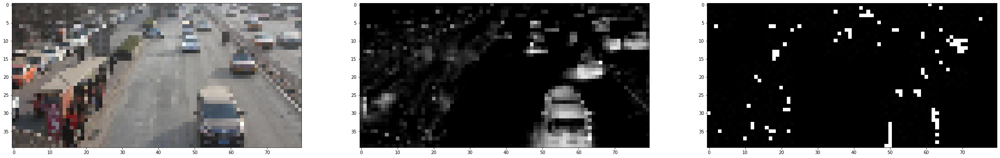

image number => 60
image number => 60
image number => 60


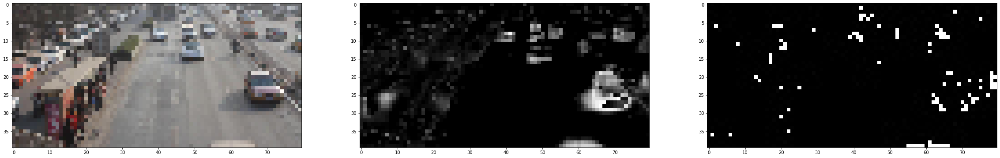

image number => 0
image number => 0
image number => 0


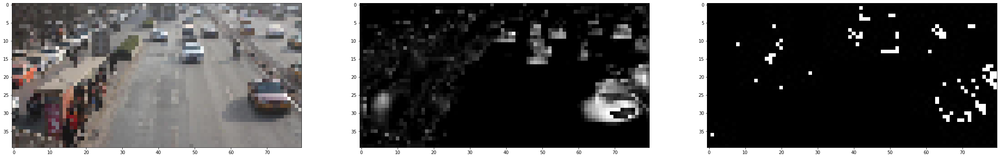

image number => 20
image number => 20
image number => 20


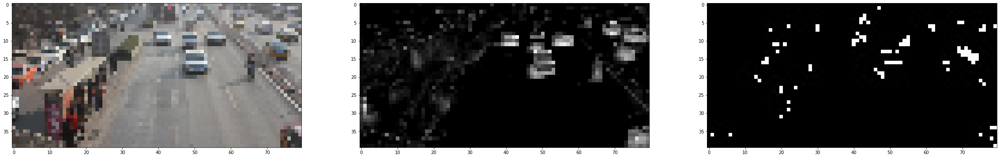

image number => 40
image number => 40
image number => 40


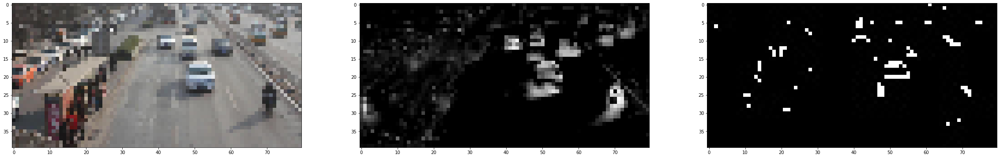

image number => 60
image number => 60
image number => 60


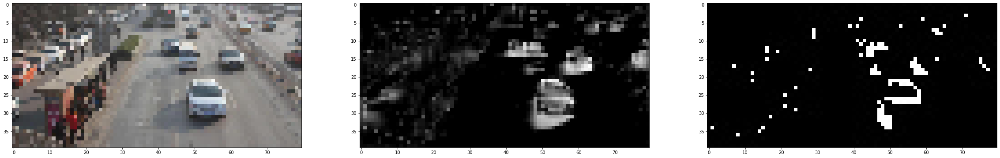

image number => 0
image number => 0
image number => 0


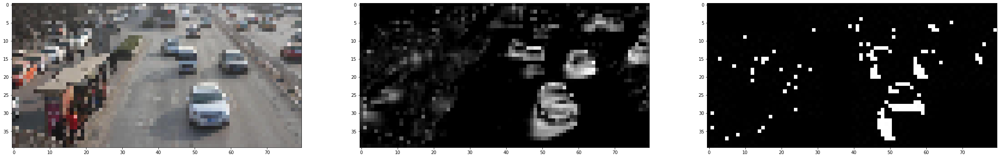

image number => 20
image number => 20
image number => 20


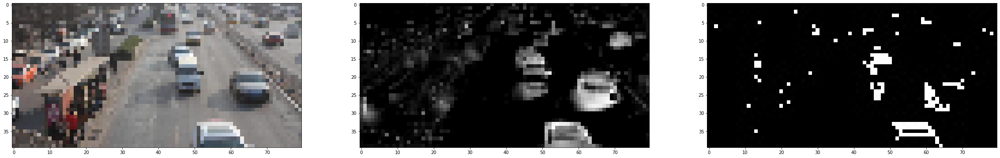

image number => 40
image number => 40
image number => 40


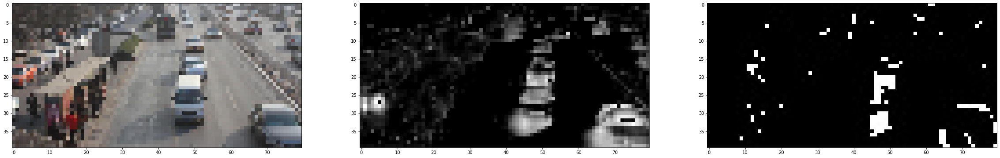

image number => 60
image number => 60
image number => 60


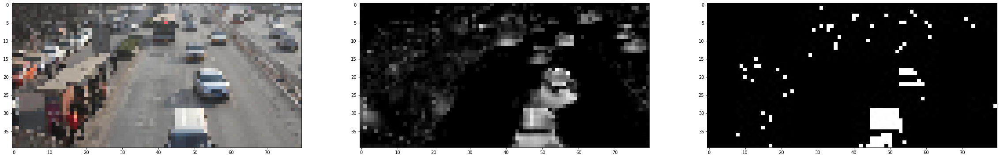

image number => 0
image number => 0
image number => 0


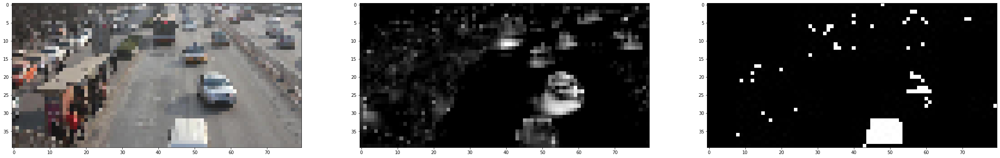

image number => 20
image number => 20
image number => 20


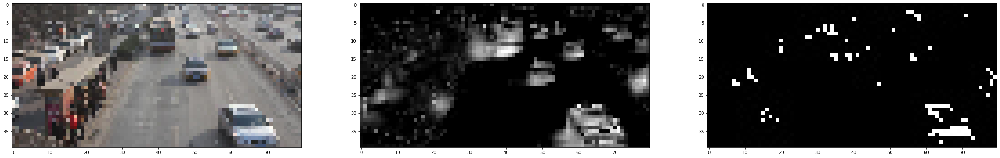

image number => 40
image number => 40
image number => 40


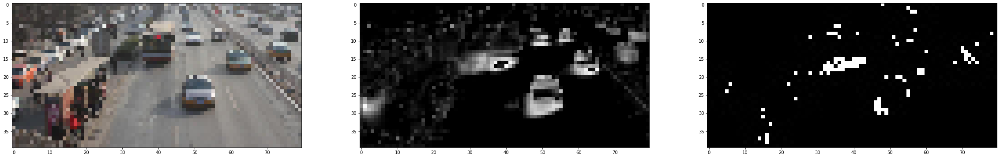

image number => 60
image number => 60
image number => 60


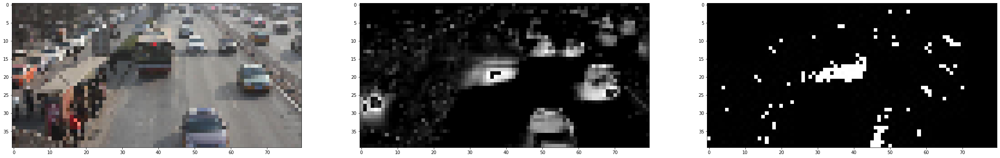

image number => 0
image number => 0
image number => 0


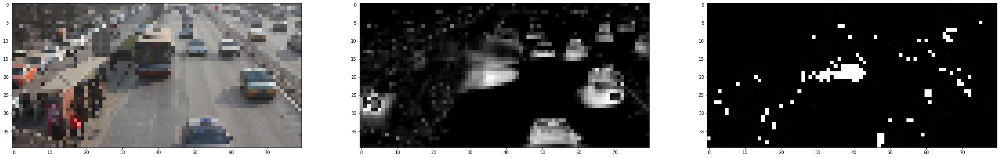

image number => 20
image number => 20
image number => 20


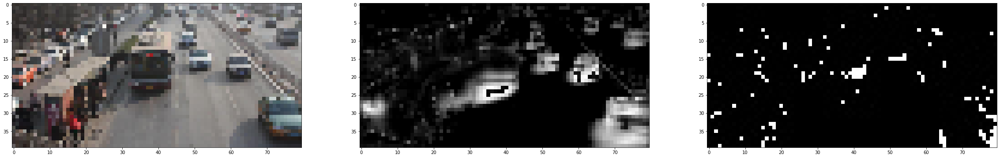

image number => 40
image number => 40
image number => 40


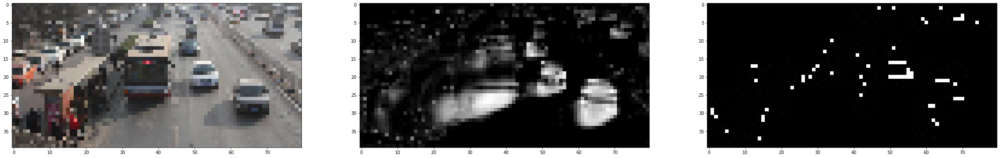

image number => 60
image number => 60
image number => 60


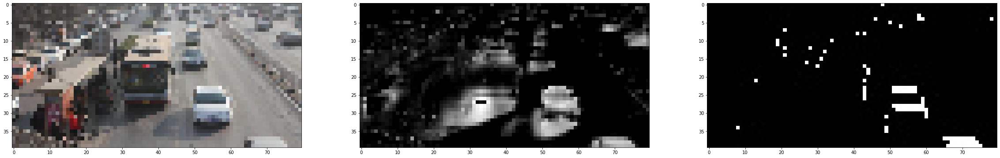

image number => 0
image number => 0
image number => 0


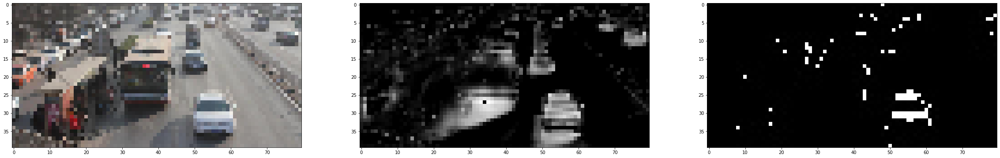

image number => 20
image number => 20
image number => 20


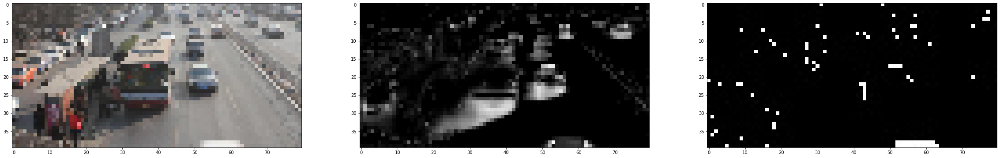

image number => 40
image number => 40
image number => 40


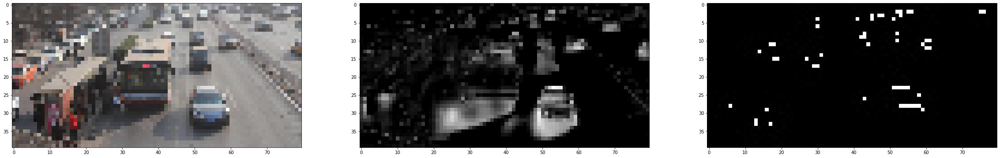

image number => 60
image number => 60
image number => 60


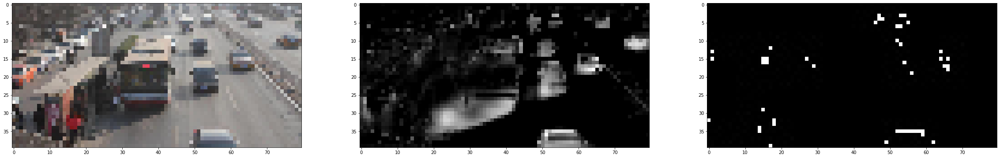

image number => 0
image number => 0
image number => 0


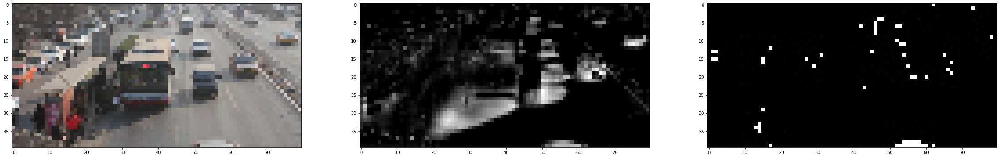

image number => 20
image number => 20
image number => 20


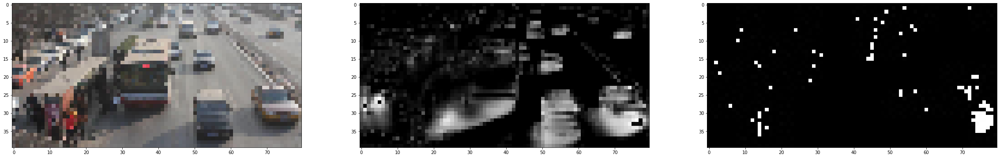

image number => 40
image number => 40
image number => 40


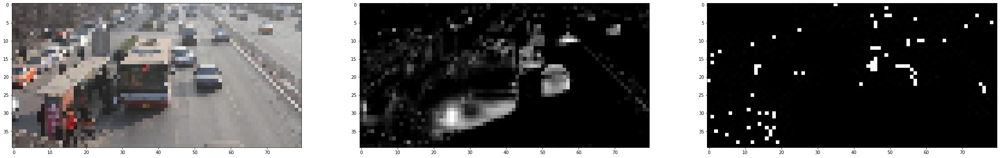

image number => 60
image number => 60
image number => 60


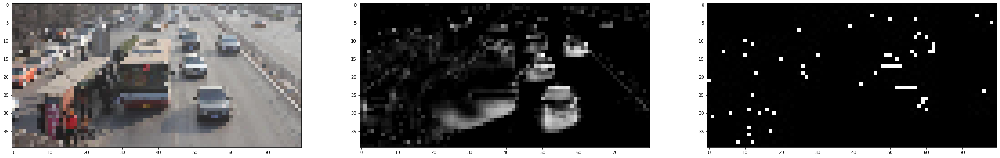

image number => 0
image number => 0
image number => 0


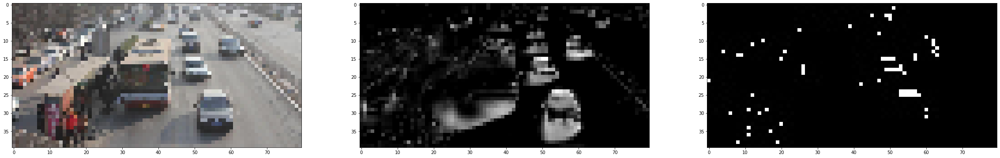

image number => 20
image number => 20
image number => 20


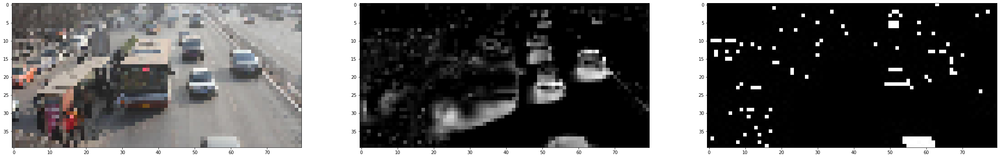

image number => 40
image number => 40
image number => 40


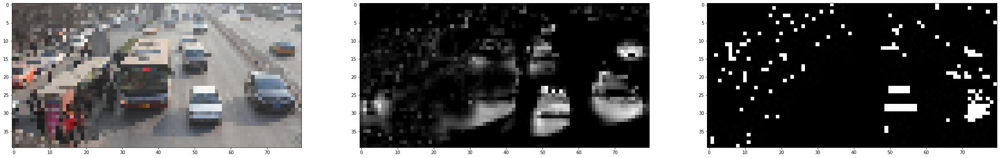

image number => 60
image number => 60
image number => 60


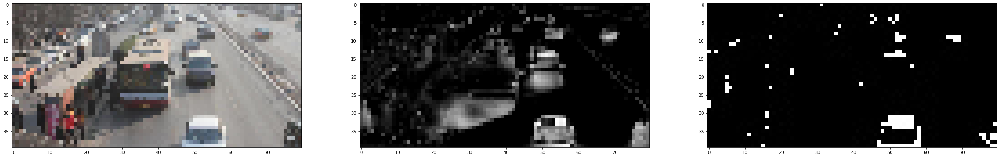

image number => 0
image number => 0
image number => 0


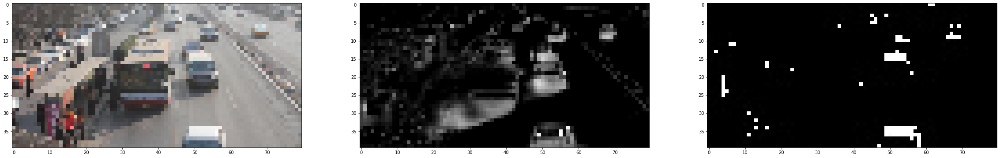

image number => 20
image number => 20
image number => 20


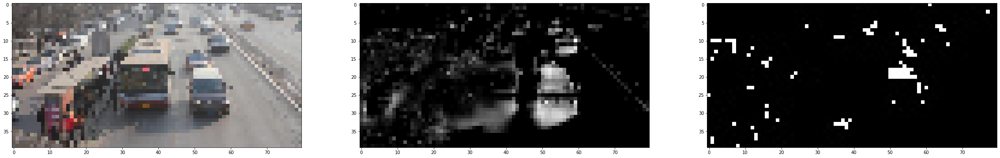

image number => 40
image number => 40
image number => 40


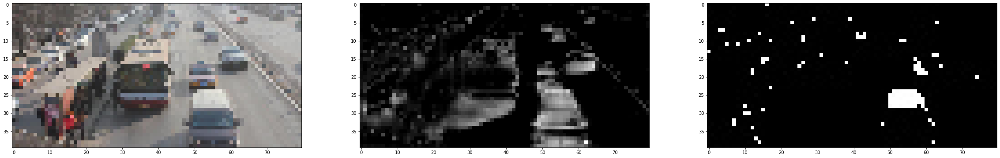

image number => 60
image number => 60
image number => 60


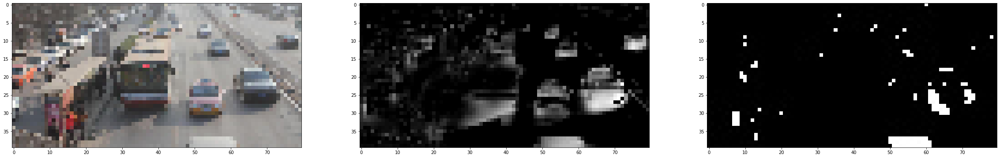

image number => 0
image number => 0
image number => 0


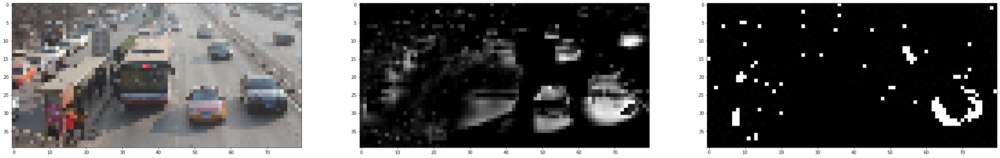

image number => 20
image number => 20
image number => 20


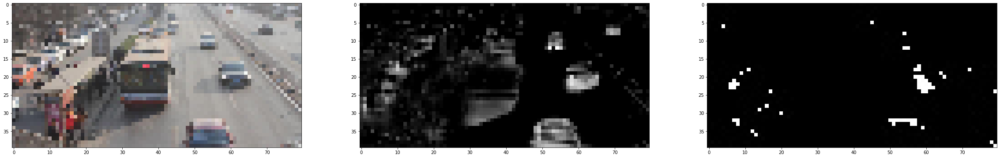

image number => 40
image number => 40
image number => 40


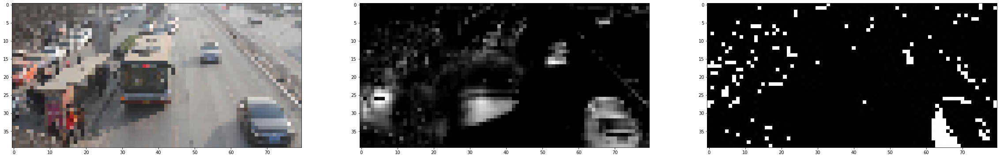

image number => 60
image number => 60
image number => 60


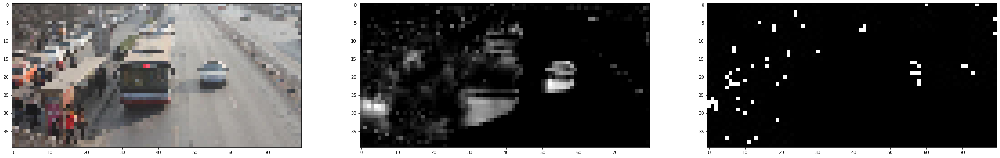

image number => 0
image number => 0
image number => 0


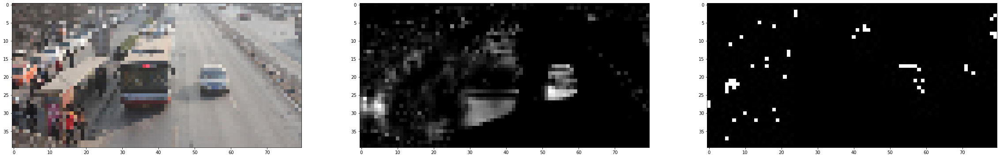

image number => 20
image number => 20
image number => 20


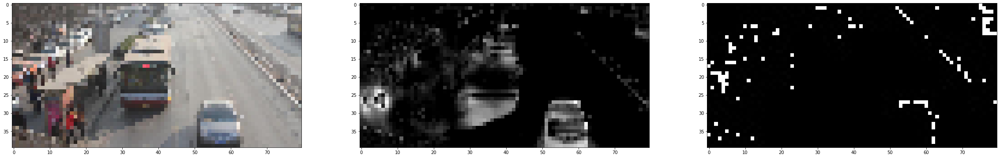

image number => 40
image number => 40
image number => 40


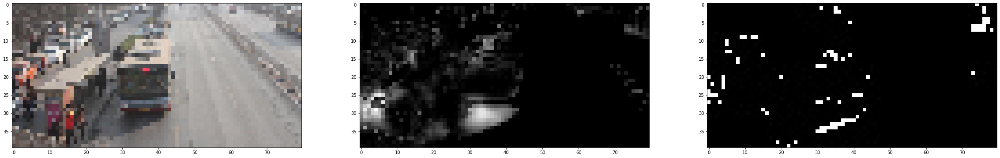

image number => 60
image number => 60
image number => 60


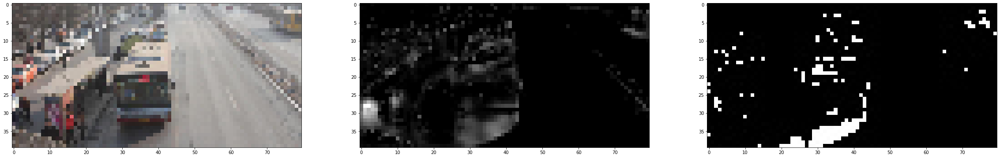

In [43]:
# we don't really need to divide train and test.. but for 'machine learning sake' let's try it out
# I want to see the segmented alongside original images side by side

# original images: X_train_norm -> Need to unnormalize this
# segmented images: seg_test -> unnormalized segmented images

batch_size = 64
n_samples, H, W, C = X_test_norm.shape

test_data = torch.from_numpy(X_test_norm).float()
test_data = test_data.permute(0,3,1,2)
seg_data = torch.from_numpy(seg_test_norm).float()
seg_data = seg_data.unsqueeze_(-1)
print(seg_data.size())
seg_data = seg_data.permute(0,3,1,2)
print(seg_data.size())


test_loader = torch.utils.data.DataLoader(torch.cat((test_data,seg_data), dim = 1), shuffle=False, batch_size=batch_size, num_workers=4, drop_last=True)

for i, images in enumerate(test_loader):    # Ignore image labels
    images_cuda = images.cuda()
    images_input_cuda = images_cuda[:,:3,:,:]
    images_output_cuda = images_cuda[:,3:,:,:]


    compressed, final = model(images_input_cuda)  
    #print_grad("Before zero_grad") ##

    # while training, I want to investigate how my images change...so let's write code for that
    image_cpu = convert(images_input_cuda)
    original_cpu = convert_one(images_output_cuda)
    final_cpu = convert_one(final)
    n_samples = image_cpu.shape[0]
    assert(image_cpu.shape[0] == original_cpu.shape[0])
    assert(image_cpu.shape[0] == final_cpu.shape[0])

    
    columns = 3
    rows = 1
    for i in range(n_samples):
        if i % 20 == 0:
            plt.figure(figsize=(40,80))
            for j in range(columns):
                print("image number =>",i)
                ax = plt.subplot(rows,columns,j + 1)
                if j == 0:     
                    ax.imshow(image_cpu[i])
                if j == 1:
                    ax.imshow(final_cpu[i], cmap = 'gray')
                if j == 2:
                    ax.imshow(original_cpu[i], cmap = 'gray')

            plt.show()


In [44]:
# Let's try thresholding...

# we don't really need to divide train and test.. but for 'machine learning sake' let's try it out
# I want to see the segmented alongside original images side by side

# original images: X_train_norm -> Need to unnormalize this
# segmented images: seg_test -> unnormalized segmented images

batch_size = 64
n_samples, H, W, C = X_test_norm.shape

test_data = torch.from_numpy(X_test_norm).float()
test_data = test_data.permute(0,3,1,2)
seg_data = torch.from_numpy(seg_test_norm).float()
seg_data = seg_data.unsqueeze_(-1)
print(seg_data.size())
seg_data = seg_data.permute(0,3,1,2)
print(seg_data.size())


test_loader = torch.utils.data.DataLoader(torch.cat((test_data,seg_data), dim = 1), shuffle=False, batch_size=batch_size, num_workers=4, drop_last=True)

#collect the generated segmented image
seg_gen_data = np.ndarray(shape=(n_samples, H, W))

for i, images in enumerate(test_loader):    # Ignore image labels
    images_cuda = images.cuda()
    images_input_cuda = images_cuda[:,:3,:,:]
    images_output_cuda = images_cuda[:,3:,:,:]


    compressed, final = model(images_input_cuda)  
    #print_grad("Before zero_grad") ##

    # while training, I want to investigate how my images change...so let's write code for that
    image_cpu = convert(images_input_cuda)
    original_cpu = convert_one(images_output_cuda)
    final_cpu = convert_one(final)
    n_samples = image_cpu.shape[0]
    assert(image_cpu.shape[0] == original_cpu.shape[0])
    assert(image_cpu.shape[0] == final_cpu.shape[0])
    
    seg_gen_data[i*batch_size:(i+1)*batch_size] = final_cpu
    

torch.Size([2085, 40, 80, 1])
torch.Size([2085, 1, 40, 80])


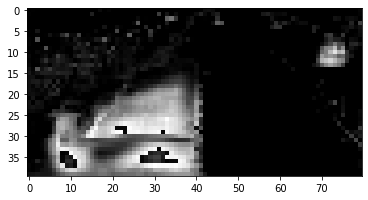

In [76]:
plt.imshow(seg_gen_data[1], cmap = 'gray')

(100, 200)
threshold


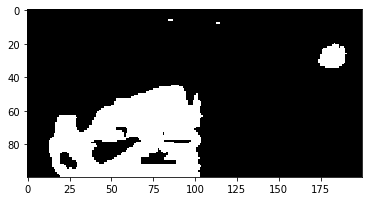

Apply morphology


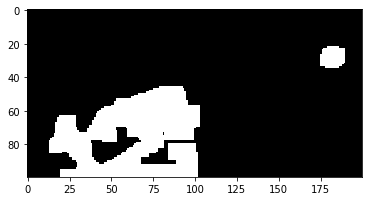

sure background


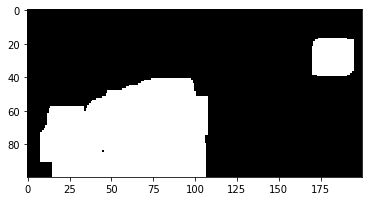

sure foreground


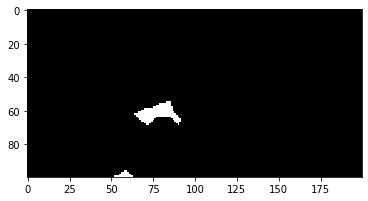

final


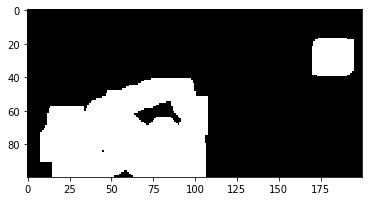

In [117]:
# some sort of softseg would be nice -> similarly lighted things should be of same color..
# But let's just try thresholding..
threshold = 100
height = 100
width = 200

play = np.copy(seg_gen_data[1]).astype(np.uint8)
play = cv2.resize(play, (width, height))
print(play.shape)

ret, thresh = cv2.threshold(play,0,255,cv2.THRESH_OTSU)

print("threshold")
plt.imshow(thresh, cmap = 'gray')
plt.show()

kernel = np.ones((3,3),np.uint8)
opening = cv2.morphologyEx(thresh,cv2.MORPH_OPEN, kernel, iterations = 3)
print("Apply morphology")
plt.imshow(opening, cmap = 'gray')
plt.show()
    
    
# sure background area
sure_bg = cv2.dilate(opening,kernel,iterations=5)

print("sure background")
plt.imshow(sure_bg, cmap = 'gray')
plt.show()
    
# Finding sure foreground area
dist_transform = cv2.distanceTransform(opening,cv2.DIST_L2,5)
ret, sure_fg = cv2.threshold(dist_transform,0.7*dist_transform.max(),255,0)
    
print("sure foreground")
plt.imshow(sure_fg, cmap = 'gray')
plt.show()    
# Finding unknown region
sure_fg = np.uint8(sure_fg)
unknown = cv2.subtract(sure_bg,sure_fg)

print("final")
plt.imshow(unknown, cmap = 'gray')
plt.show()